# 2026-08-30 Paper II Q4: infer the SF direction, then compare with VIVA

**Do close-to-peak galaxies show a coherent direction of enhanced or less-suppressed
surviving star formation, and is it consistent with coarse H I stripping geometry?**

This new notebook leaves both the Q3 and first-pass Q4 notebooks unchanged. It retains Q3's
sample, SF cuts and pre-peak control, but replaces the wind-first test with
an independent MUSE position-angle scan. There is no orbit or 3-D wind reconstruction.

1. Reconstruct Q3 and map stellar density, SFR, $\Delta_{\rm env}$,
   $\delta_{\rm local}$ and $z_{\rm env}$ for **every eligible product**, without H I arrows.
2. Scan sky PA $0,1,\ldots,359$ degrees. Use the local-residual contrast as the primary
   intensity direction and the enhanced-fraction contrast as a complementary measure.
3. Freeze those results, then compare with the existing independently sourced VIVA
   compass sectors, with a fixed **+/-45 degree** bracket.
4. Distinguish a side being above the pre-peak control from it merely being less suppressed.

The data and direction code do not consume H I angles. However, this is a retrospective
analysis following earlier map inspection, **not a newly preregistered blind experiment**.
The saved run is descriptive: the optional radial-shuffle test is off by default.
Figures and tables are embedded; external saves are disabled. No FITS products are modified.

## 1. Unchanged Q3 selection and explicit Q4 controls

In [1]:
from pathlib import Path

PROJECT_ROOT = Path.cwd().resolve()
DATA_ROOT = PROJECT_ROOT / "v3tk_v7.6.8"
CATALOG_PATH = PROJECT_ROOT / "mauve_master_wiki_newclass.fits"
GEOMETRY_PATH = PROJECT_ROOT / "MAUVE_effective_radii.csv"
GALAXY_COLOR_PATH = PROJECT_ROOT / "MAUVE_galaxy_colors.dat"
OUTPUT_DIR = PROJECT_ROOT / "outputs" / "paper2_Q4_direction_scan_VIVA"
FIGURE_DIR = OUTPUT_DIR / "figures"
TABLE_DIR = OUTPUT_DIR / "tables"
DIAGNOSTIC_DIR = OUTPUT_DIR / "diagnostics"

MASS_FILE_PATTERN = "{galid}_spatial_binning_maps_further.fits"
SFR_FILE_PATTERNS = (
    "{galid}_gas_bin_maps_further.fits",
    "{galid}_gas_BIN_maps_further.fits",
)
EW_FILE_PATTERNS = (
    "{galid}_proxy_EW_maps_further.fits",
    "{galid}_proxy_EW_maps.fits",
)
MASK_FILE_PATTERN = "{galid}_mask.fits"

MASS_HDU = "LOGMASS_SURFACE_DENSITY"
BIN_HDU_MASS = "BINID"
BIN_HDU_GAS = "BIN_ID"
SFR_HDU_PRIMARY = "LOGSFR_SURFACE_DENSITY_HII"
SFR_HDU_ROBUST = "LOGSFR_SURFACE_DENSITY_SF"
EW_HDU = "PROXY_EWHA"
EW_HA_MIN = 6.0
HALPHA_SIGMA_OBS_HDU = "HA6562_SIGMA"
HALPHA_SIGMA_CORR_HDU = "HA6562_SIGMA_CORR"
HALPHA_SIGMA_MAX = 45.0
MASK_TABLE_HDU = "MASKFILE"
MASK_COLUMN = "MASK"               # live nGIST convention: 0 usable, 1 masked

N_SIGMA_BINS = 12
SIGMA_RANGE = (6.0, 10.0)          # fixed common grid; unsupported bins are masked later
R_EDGES = __import__('numpy').arange(0.0, 1.6 + 0.2, 0.2)
N_RADIUS_2D_BINS = len(R_EDGES) - 1

I_MAX_PRIMARY = 80.0
I_MAX_ROBUSTNESS = (60.0, 65.0, 70.0, 80.0)
N_BOOTSTRAP = 10_000
N_PERMUTATIONS = 10_000
MIN_SF_GAL_PRIMARY = 50
NMIN_SENSITIVITY = (20, 50, 100)
EQUAL_GALAXY_VIOLIN_DRAWS = 2_000
RANDOM_SEED = 42

MIN_VALID_PIXELS_PER_BIN = 50
MIN_SF_PIXELS_PER_BIN = 20
MIN_GALAXIES_PER_STAGE_BIN = 3
MIN_GALAXIES_PER_2D_CELL = 3
WCS_TOLERANCE_ARCSEC = 0.05
STRICT_VALIDATION = True
EXCLUDED_GALAXIES = {}             # mapping GALID -> explicit reason; empty by design
SAVE_OUTPUTS = False             # enable only when figure/CSV output is explicitly requested

STAGE_ORDER = ("pre-peak", "close-to-peak", "post-peak")
STAGE_COLORS = {
    "pre-peak": "#2166ac",
    "close-to-peak": "#1a9850",
    "post-peak": "#d73027",
}

if SAVE_OUTPUTS:
    for path in (FIGURE_DIR, TABLE_DIR, DIAGNOSTIC_DIR):
        path.mkdir(parents=True, exist_ok=True)

print(f"Project root: {PROJECT_ROOT}")
print(f"Data root: {DATA_ROOT}")
print(f"Outputs: {OUTPUT_DIR} (disabled unless SAVE_OUTPUTS=True)")
print("No additional inclination correction will be applied to either surface-density map.")
print(f"SF selection: finite HII/SF map + {EW_HDU}>{EW_HA_MIN:g} Angstrom + intrinsic Halpha sigma<{HALPHA_SIGMA_MAX:g} km/s")


# Direction inference uses no H I metadata.
MIN_SIDE_PIXELS = 20
PA_GRID = __import__('numpy').arange(360, dtype=float)
RESIDUAL_VLIM = 0.8
Z_VLIM = 2.0
RUN_90_DEG_SECTORS = True        # secondary, never replaces the hemisphere result
RUN_RADIAL_SHUFFLE = False      # expensive; no gradient-significance claim when off
N_RADIAL_SHUFFLES = 1000
SHUFFLE_RADIAL_WIDTH_RE = 0.5   # bins extend through the full observed radial range
MIN_VALID_ANGLE_FRACTION = 0.90
PEAK_FRACTION = 0.95            # descriptive near-maximum breadth, NOT a PA error bar

Project root: /Users/Igniz/Desktop/ICRAR/further
Data root: /Users/Igniz/Desktop/ICRAR/further/v3tk_v7.6.8
Outputs: /Users/Igniz/Desktop/ICRAR/further/outputs/paper2_Q4_direction_scan_VIVA (disabled unless SAVE_OUTPUTS=True)
No additional inclination correction will be applied to either surface-density map.
SF selection: finite HII/SF map + PROXY_EWHA>6 Angstrom + intrinsic Halpha sigma<45 km/s


## 2. Embedded Q3 helpers and source provenance

In [2]:
from __future__ import annotations

import math

import warnings

from dataclasses import dataclass

import matplotlib as mpl

import matplotlib.pyplot as plt

import numpy as np

import pandas as pd

from astropy.io import fits

from astropy.wcs import WCS

from IPython.display import display

from scipy.special import expit

RNG = np.random.default_rng(RANDOM_SEED)

mpl.rcParams.update({
    "figure.dpi": 120,
    "savefig.dpi": 300,
    "font.size": 11,
    "axes.grid": False,
})

def save_table(frame: pd.DataFrame, filename: str) -> Path:
    path = TABLE_DIR / filename
    if SAVE_OUTPUTS:
        frame.to_csv(path, index=False)
    return path

def save_figure(fig, stem: str, *, diagnostic: bool = False):
    directory = DIAGNOSTIC_DIR if diagnostic else FIGURE_DIR
    if SAVE_OUTPUTS:
        fig.savefig(directory / f"{stem}.png", dpi=300, bbox_inches="tight")
        fig.savefig(directory / f"{stem}.pdf", bbox_inches="tight")

def normalise_stage_label(value) -> str:
    mapping = {
        1: "pre-peak", 1.0: "pre-peak", "1": "pre-peak",
        2: "close-to-peak", 2.0: "close-to-peak", "2": "close-to-peak",
        3: "post-peak", 3.0: "post-peak", "3": "post-peak",
        "prepeak": "pre-peak", "pre-peak": "pre-peak",
        "close-to-peak": "close-to-peak", "closetopeak": "close-to-peak",
        "near-peak": "close-to-peak", "postpeak": "post-peak",
        "post-peak": "post-peak",
    }
    key = value if isinstance(value, (int, float)) else str(value).strip().lower().replace(" ", "")
    if key not in mapping:
        raise ValueError(f"Unrecognised RPS/infall stage label: {value!r}")
    return mapping[key]

def first_existing(paths):
    for path in paths:
        if path.exists():
            return path
    return None

def load_fits_map(path: Path, hdu_name: str, *, return_header: bool = False):
    if not path.exists():
        raise FileNotFoundError(path)
    with fits.open(path, memmap=True) as hdul:
        names = {h.name.upper() for h in hdul}
        if hdu_name.upper() not in names:
            raise KeyError(f"{path}: missing HDU {hdu_name}; available={sorted(names)}")
        hdu = hdul[hdu_name]
        data = np.asarray(hdu.data, dtype=float).copy()
        header = hdu.header.copy()
    return (data, header) if return_header else data

def load_ngist_mask(path: Path, shape):
    if not path.exists():
        raise FileNotFoundError(path)
    with fits.open(path, memmap=True) as hdul:
        if MASK_TABLE_HDU not in hdul:
            raise KeyError(f"{path}: missing table HDU {MASK_TABLE_HDU}")
        table = hdul[MASK_TABLE_HDU].data
        if MASK_COLUMN not in table.names:
            raise KeyError(f"{path}: missing mask column {MASK_COLUMN}; available={table.names}")
        flat = np.asarray(table[MASK_COLUMN], dtype=int)
    if flat.size != int(np.prod(shape)):
        raise ValueError(f"{path}: mask length {flat.size} cannot reshape to {shape}")
    return flat.reshape(shape)

def celestial_wcs_separation_arcsec(header_a, header_b, shape):
    wa = WCS(header_a).celestial
    wb = WCS(header_b).celestial
    if not wa.has_celestial or not wb.has_celestial:
        return np.inf
    ny, nx = shape
    x = np.array([0, nx - 1, 0, nx - 1, (nx - 1) / 2])
    y = np.array([0, 0, ny - 1, ny - 1, (ny - 1) / 2])
    raa, deca = wa.pixel_to_world_values(x, y)
    rab, decb = wb.pixel_to_world_values(x, y)
    cosd = np.cos(np.deg2rad((deca + decb) / 2))
    return float(np.nanmax(np.hypot((raa - rab) * cosd, deca - decb)) * 3600.0)

def tangent_offsets_arcsec(ra_deg, dec_deg, ra0_deg, dec0_deg):
    ra, dec = np.deg2rad(ra_deg), np.deg2rad(dec_deg)
    ra0, dec0 = np.deg2rad(float(ra0_deg)), np.deg2rad(float(dec0_deg))
    dra = (ra - ra0 + np.pi) % (2 * np.pi) - np.pi
    cosc = np.sin(dec0) * np.sin(dec) + np.cos(dec0) * np.cos(dec) * np.cos(dra)
    with np.errstate(divide="ignore", invalid="ignore"):
        east = np.cos(dec) * np.sin(dra) / cosc
        north = (np.cos(dec0) * np.sin(dec) - np.sin(dec0) * np.cos(dec) * np.cos(dra)) / cosc
    return east * 206264.806247, north * 206264.806247

def calculate_deprojected_radius(shape, header, component_rows: pd.DataFrame):
    """Return min elliptical R/Re over physical components (union geometry for NGC4567_8)."""
    wcs = WCS(header).celestial
    if not wcs.has_celestial:
        raise ValueError("No celestial WCS available for radius calculation")
    yy, xx = np.indices(shape, dtype=float)
    ra, dec = wcs.pixel_to_world_values(xx, yy)
    radius = np.full(shape, np.inf, dtype=float)
    for _, row in component_rows.iterrows():
        east, north = tangent_offsets_arcsec(ra, dec, row.center_ra_deg, row.center_dec_deg)
        pa = np.deg2rad(float(row.pa_deg_east_of_north))
        major = east * np.sin(pa) + north * np.cos(pa)
        minor = east * np.cos(pa) - north * np.sin(pa)
        r = np.sqrt((major / float(row.a_re_arcsec)) ** 2 + (minor / float(row.b_re_arcsec)) ** 2)
        radius = np.minimum(radius, r)
    radius[~np.isfinite(radius)] = np.nan
    return radius

def make_valid_disc_mask(log_sigma_star, bin_id, ngist_mask, radius_re):
    return (
        np.isfinite(log_sigma_star)
        & np.isfinite(bin_id)
        & (ngist_mask == 0)
        & np.isfinite(radius_re)
    )

def intrinsic_sigma_from_maps(sigma_obs, sigma_corr):
    sigma_obs = np.asarray(sigma_obs, dtype=float)
    sigma_corr = np.asarray(sigma_corr, dtype=float)
    if sigma_obs.shape != sigma_corr.shape:
        raise ValueError(
            f"Observed/correction Halpha sigma shape mismatch: {sigma_obs.shape} vs {sigma_corr.shape}"
        )
    sigma2_intrinsic = sigma_obs**2 - sigma_corr**2
    sigma_intrinsic = np.full(sigma_obs.shape, np.nan, dtype=float)
    valid = np.isfinite(sigma2_intrinsic) & (sigma2_intrinsic > 0)
    sigma_intrinsic[valid] = np.sqrt(sigma2_intrinsic[valid])
    return sigma_intrinsic

def make_sf_mask(valid_disc_mask, log_sigma_sfr, ew_ha, halpha_sigma_intrinsic):
    """Project SF definition: HII/SF map + EW(Halpha)>6 A + intrinsic sigma<45 km/s."""
    return (
        valid_disc_mask
        & np.isfinite(log_sigma_sfr)
        & np.isfinite(ew_ha)
        & (ew_ha > EW_HA_MIN)
        & np.isfinite(halpha_sigma_intrinsic)
        & (halpha_sigma_intrinsic < HALPHA_SIGMA_MAX)
    )

def load_galaxy_maps(row, geometry, sfr_hdu=SFR_HDU_PRIMARY):
    mass, mass_header = load_fits_map(row.mass_path, MASS_HDU, return_header=True)
    mass_bin = load_fits_map(row.mass_path, BIN_HDU_MASS)
    gas_bin, gas_header = load_fits_map(row.sfr_path, BIN_HDU_GAS, return_header=True)
    sfr = load_fits_map(row.sfr_path, sfr_hdu)
    ew_ha = load_fits_map(row.ew_path, EW_HDU)
    halpha_sigma_obs = load_fits_map(row.sfr_path, HALPHA_SIGMA_OBS_HDU)
    halpha_sigma_corr = load_fits_map(row.sfr_path, HALPHA_SIGMA_CORR_HDU)
    shapes = {
        mass.shape, mass_bin.shape, gas_bin.shape, sfr.shape, ew_ha.shape,
        halpha_sigma_obs.shape, halpha_sigma_corr.shape,
    }
    if len(shapes) != 1:
        raise ValueError(f"{row.GALID}: map shape mismatch {sorted(shapes)}")
    wcs_sep = celestial_wcs_separation_arcsec(mass_header, gas_header, mass.shape)
    if not np.isfinite(wcs_sep) or wcs_sep > WCS_TOLERANCE_ARCSEC:
        raise ValueError(f"{row.GALID}: mass/gas WCS mismatch {wcs_sep:.4f} arcsec")
    ngist_mask = load_ngist_mask(row.mask_path, mass.shape)
    components = geometry.loc[geometry.notebook_product_id.eq(row.GALID)].copy()
    if components.empty:
        raise KeyError(f"{row.GALID}: no geometry rows")
    radius_re = calculate_deprojected_radius(mass.shape, mass_header, components)
    halpha_sigma_intrinsic = intrinsic_sigma_from_maps(halpha_sigma_obs, halpha_sigma_corr)
    valid = make_valid_disc_mask(mass, gas_bin, ngist_mask, radius_re)
    classification = valid & np.isfinite(sfr)
    sf = make_sf_mask(valid, sfr, ew_ha, halpha_sigma_intrinsic)
    return {
        "log_sigma_star": mass,
        "log_sigma_sfr": sfr,
        "ew_ha": ew_ha,
        "halpha_sigma_intrinsic": halpha_sigma_intrinsic,
        "mass_bin_id": mass_bin,
        "gas_bin_id": gas_bin,
        "ngist_mask": ngist_mask,
        "radius_re": radius_re,
        "valid_disc_mask": valid,
        "classification_mask": classification,
        "sf_mask": sf,
        "wcs_separation_arcsec": wcs_sep,
    }

def binned_indices(values, edges):
    return np.digitize(values, edges, right=False) - 1

def load_galaxy_colors(path):
    """Read the fixed, project-approved MAUVE galaxy colour mapping."""
    colors = {}
    for line in path.read_text().splitlines():
        fields = line.split()
        if not fields or fields[0].startswith("#") or fields[0] == "reserved":
            continue
        if fields[0] == "alias":
            colors[fields[1]] = fields[3]
        elif fields[0].isdigit():
            colors[fields[1]] = fields[3]
    return colors

def weighted_quantile(values, quantiles, weights=None):
    """Linear weighted quantiles; finite values with strictly positive weights only."""
    values = np.asarray(values, dtype=float)
    quantiles = np.atleast_1d(np.asarray(quantiles, dtype=float))
    if weights is None:
        weights = np.ones(values.size, dtype=float)
    weights = np.asarray(weights, dtype=float)
    keep = np.isfinite(values) & np.isfinite(weights) & (weights > 0)
    values, weights = values[keep], weights[keep]
    if values.size == 0:
        return np.full(quantiles.shape, np.nan)
    order = np.argsort(values)
    values, weights = values[order], weights[order]
    cumulative = np.cumsum(weights) - 0.5 * weights
    cumulative /= weights.sum()
    return np.interp(quantiles, cumulative, values, left=values[0], right=values[-1])

def interpolate_supported_reference(x, reference):
    supported = reference.loc[reference.supported & reference.reference.notna()].sort_values("sigma_center")
    if len(supported) < 2:
        return np.full(np.asarray(x).shape, np.nan)
    return np.interp(
        np.asarray(x, dtype=float),
        supported.sigma_center.to_numpy(),
        supported.reference.to_numpy(),
        left=np.nan,
        right=np.nan,
    )

def galaxy_metric_row(galid, stage, delta, z):
    delta = np.asarray(delta, dtype=float)
    z = np.asarray(z, dtype=float)
    delta = delta[np.isfinite(delta)]
    z = z[np.isfinite(z)]
    q16, q50, q84 = np.nanpercentile(delta, [16, 50, 84]) if delta.size else (np.nan,) * 3
    f_enh = np.mean(z > 1) if z.size else np.nan
    f_sup = np.mean(z < -1) if z.size else np.nan
    f_strong_enh = np.mean(z > 2) if z.size else np.nan
    f_strong_sup = np.mean(z < -2) if z.size else np.nan
    width = (q84 - q16) / 2 if delta.size else np.nan
    asymmetry = ((q84 - q50) - (q50 - q16)) / (q84 - q16) if delta.size and q84 > q16 else np.nan
    return {
        "GALID": galid, "stage": stage, "N_delta": delta.size, "N_z": z.size,
        "P16": q16, "M": q50, "P84": q84, "W": width,
        "f_enh": f_enh, "f_sup": f_sup,
        "f_strong_enh": f_strong_enh, "f_strong_sup": f_strong_sup,
        "F_tail": f_enh + f_sup, "A_tail": f_enh - f_sup, "S_asym": asymmetry,
    }

from IPython.display import Markdown
from matplotlib.patches import Ellipse
from scipy.stats import binomtest
import hashlib
import json

In [3]:
SOURCE_HASHES = {
    '20260829_check_surviving_SF_distribution.ipynb': '484d1543828d909c1d779986e233121f562473473ea13eb68b418b6abca639b6',
    '20260830_check_SF_spatial_asymmetry.ipynb': 'ced1ed03749813bd3dbf44a3c73bd62b013fa5d60195e38fe5077785f4464431',
}
for name, expected in SOURCE_HASHES.items():
    path = PROJECT_ROOT / name
    if path.exists():
        actual = hashlib.sha256(path.read_bytes()).hexdigest()
        print(name, 'matches construction source' if actual == expected else 'CHANGED since construction')
    else:
        print(name, 'not present; embedded code remains executable')
print('Current input catalogue hashes:')
for path in [CATALOG_PATH, GEOMETRY_PATH, GALAXY_COLOR_PATH]:
    print(path.name, hashlib.sha256(path.read_bytes()).hexdigest())

20260829_check_surviving_SF_distribution.ipynb matches construction source
20260830_check_SF_spatial_asymmetry.ipynb matches construction source
Current input catalogue hashes:
mauve_master_wiki_newclass.fits 05fbc2ba45b6cde2b02e67b6a06f646491b642c009186f0cd5176b9dc6e5af0c
MAUVE_effective_radii.csv e7f0300c43376fbc0d35977b4512a57b84169b8472b3febaba7bf67851d60111
MAUVE_galaxy_colors.dat 18874f26dacd3b5e8113574d7ba1d90a57cac19a6f4efa22673e76dc649dbab4


The inherited scientific helpers were compared with Q3 at construction.
The only discovery extension below accepts `.fits.gz` as a fallback after the
original filename preferences. It does not change the science selection.

## 3. Live inventory, stage consistency and product QC

In [4]:
def read_master_catalogue(path):
    with fits.open(path) as hdul:
        table = hdul[1].data
        required = {"Galaxy", "logMstar", "class"}
        missing = required - set(table.names)
        if missing:
            raise KeyError(f"{path}: missing catalogue columns {sorted(missing)}")
        frame = pd.DataFrame({
            "galaxy": [str(v).strip() for v in table["Galaxy"]],
            "logMstar": np.asarray(table["logMstar"], dtype=float),
            "stage_code": np.asarray(table["class"], dtype=float),
        })
    frame["stage"] = frame.stage_code.map(normalise_stage_label)
    return frame


def discover_products(data_root):
    rows = []
    for folder in sorted(p for p in data_root.iterdir() if p.is_dir() and not p.name.endswith("_logs")):
        galid = folder.name
        mass_base = folder / MASS_FILE_PATTERN.format(galid=galid)
        mass = first_existing([mass_base, Path(str(mass_base)+'.gz')]) or mass_base
        sfr_paths = [folder / p.format(galid=galid) for p in SFR_FILE_PATTERNS]
        sfr = first_existing(sfr_paths + [Path(str(p)+'.gz') for p in sfr_paths])
        ew_paths = [folder / p.format(galid=galid) for p in EW_FILE_PATTERNS]
        ew = first_existing(ew_paths + [Path(str(p)+'.gz') for p in ew_paths])
        mask_base = folder / MASK_FILE_PATTERN.format(galid=galid)
        mask = first_existing([mask_base, Path(str(mask_base)+'.gz')]) or mask_base
        rows.append({"GALID": galid, "mass_path": mass, "sfr_path": sfr, "ew_path": ew, "mask_path": mask})
    return pd.DataFrame(rows)


master = read_master_catalogue(CATALOG_PATH)
geometry = pd.read_csv(GEOMETRY_PATH)
required_geometry = {
    "galaxy", "notebook_product_id", "mauve_infall_stage", "center_ra_deg", "center_dec_deg",
    "inclination_deg", "pa_deg_east_of_north", "a_re_arcsec", "b_re_arcsec",
}
missing_geometry = required_geometry - set(geometry.columns)
if missing_geometry:
    raise KeyError(f"{GEOMETRY_PATH}: missing columns {sorted(missing_geometry)}")
if geometry.galaxy.duplicated().any():
    raise ValueError("Geometry catalogue contains duplicate physical-galaxy rows")

geometry = geometry.merge(master[["galaxy", "logMstar", "stage"]], on="galaxy", how="left", validate="one_to_one")
if geometry[["logMstar", "stage"]].isna().any().any():
    raise RuntimeError("Geometry/master catalogue merge left missing mass or stage values")
geometry["stage_from_geometry"] = geometry.mauve_infall_stage.map(normalise_stage_label)
if not geometry.stage.eq(geometry.stage_from_geometry).all():
    bad = geometry.loc[~geometry.stage.eq(geometry.stage_from_geometry), ["galaxy", "stage", "stage_from_geometry"]]
    raise RuntimeError(f"Stage disagreement between catalogues:\n{bad}")

product_meta = []
for galid, group in geometry.groupby("notebook_product_id", sort=False):
    if group.stage.nunique() != 1:
        raise RuntimeError(f"{galid}: physical components have inconsistent stages")
    product_meta.append({
        "GALID": galid,
        "components": ",".join(group.galaxy),
        "stage": group.stage.iloc[0],
        "logMstar_global": np.log10(np.sum(10 ** group.logMstar.to_numpy())),
        "inclination": group.inclination_deg.max(),
    })
product_meta = pd.DataFrame(product_meta)

inventory = product_meta.merge(discover_products(DATA_ROOT), on="GALID", how="outer", validate="one_to_one")
inventory["manual_exclusion_reason"] = inventory.GALID.map(EXCLUDED_GALAXIES).fillna("")
inventory["analysis_candidate"] = inventory.manual_exclusion_reason.eq("")

def path_exists(value):
    return isinstance(value, Path) and value.exists()

inventory["mass_exists"] = inventory.mass_path.map(path_exists)
inventory["sfr_exists"] = inventory.sfr_path.map(path_exists)
inventory["ew_exists"] = inventory.ew_path.map(path_exists)
inventory["mask_exists"] = inventory.mask_path.map(path_exists)
inventory["catalogue_complete"] = inventory[["stage", "logMstar_global", "inclination"]].notna().all(axis=1)
display(inventory[["GALID", "components", "stage", "logMstar_global", "inclination",
                   "mass_exists", "sfr_exists", "ew_exists", "mask_exists", "manual_exclusion_reason"]])
print("Inventory stage counts:", inventory.groupby("stage").GALID.nunique().to_dict())

Inventory stage counts: {'close-to-peak': 10, 'post-peak': 18, 'pre-peak': 11}


,GALID,components,stage,logMstar_global,inclination,mass_exists,sfr_exists,ew_exists,mask_exists,manual_exclusion_reason
0,IC3392,IC3392,post-peak,9.823572,68,True,True,True,True,
1,NGC4064,NGC4064,post-peak,10.046130,70,True,True,True,True,
2,NGC4189,NGC4189,pre-peak,9.734349,42,True,True,True,True,
3,NGC4192,NGC4192,pre-peak,10.764349,83,True,True,True,True,
4,NGC4216,NGC4216,post-peak,10.894349,90,False,False,False,False,
5,NGC4222,NGC4222,pre-peak,9.434349,90,True,True,True,True,
6,NGC4254,NGC4254,pre-peak,10.504350,39,True,True,True,True,
7,NGC4293,NGC4293,post-peak,10.526728,67,True,True,True,True,
8,NGC4294,NGC4294,pre-peak,9.364349,74,True,True,True,True,
9,NGC4298,NGC4298,close-to-peak,10.094349,52,True,True,True,True,


### Q3 mask and product checks

The usable footprint is `MASK == 0`, finite stellar mass and gas-bin maps, and
finite catalogue geometry. Surviving SF additionally requires finite H II SFR,
EW(Halpha) > 6 Angstrom, and $0 < \sigma_{\mathrm{H}\alpha,\mathrm{int}} <45$
km/s, where the intrinsic width is the square root of observed squared minus
correction squared. No new inclination correction is applied to the densities.
The primary inclination cut remains $i<80^\circ$.

In [5]:
qc_rows = []
for row in inventory.itertuples(index=False):
    flags = []
    maps = None
    if not row.analysis_candidate:
        flags.append(f"manual_exclusion:{row.manual_exclusion_reason}")
    for label, exists in (("mass", row.mass_exists), ("sfr", row.sfr_exists), ("ew", row.ew_exists), ("mask", row.mask_exists)):
        if not exists:
            flags.append(f"missing_{label}_product")
    if not row.catalogue_complete:
        flags.append("missing_catalogue_metadata")
    if not flags:
        try:
            maps = load_galaxy_maps(row, geometry, SFR_HDU_PRIMARY)
            valid, sf = maps["valid_disc_mask"], maps["sf_mask"]
            classified = maps["classification_mask"]
            if np.any(sf & ~valid):
                flags.append("sf_not_subset_of_valid")
        except Exception as exc:
            flags.append(f"load_error:{type(exc).__name__}:{exc}")
    valid = maps["valid_disc_mask"] if maps is not None else np.zeros(0, dtype=bool)
    sf = maps["sf_mask"] if maps is not None else np.zeros(0, dtype=bool)
    classified = maps["classification_mask"] if maps is not None else np.zeros(0, dtype=bool)
    qc_rows.append({
        "GALID": row.GALID, "components": row.components, "stage": row.stage,
        "logMstar_global": row.logMstar_global, "inclination": row.inclination,
        "N_valid_stellar_pixels": int(valid.sum()),
        "N_HII_classified_pixels_before_EW_sigma": int(classified.sum()),
        "N_HII_EW_sigma_SF_pixels": int(sf.sum()),
        "selected_SF_area_fraction": float(sf.sum() / valid.sum()) if valid.size and valid.sum() else np.nan,
        "max_usable_R_over_Re": float(np.nanmax(maps["radius_re"][valid])) if maps is not None and valid.any() else np.nan,
        "logSigmaStar_min": float(np.nanmin(maps["log_sigma_star"][valid])) if maps is not None and valid.any() else np.nan,
        "logSigmaStar_max": float(np.nanmax(maps["log_sigma_star"][valid])) if maps is not None and valid.any() else np.nan,
        "logSigmaSFR_min": float(np.nanmin(maps["log_sigma_sfr"][sf])) if maps is not None and sf.any() else np.nan,
        "logSigmaSFR_max": float(np.nanmax(maps["log_sigma_sfr"][sf])) if maps is not None and sf.any() else np.nan,
        "wcs_separation_arcsec": maps["wcs_separation_arcsec"] if maps is not None else np.nan,
        "QC_flag": ";".join(flags) if flags else "OK",
    })

qc = pd.DataFrame(qc_rows)
save_table(qc, "Q4_sample_QC.csv")
display(qc)
failures = qc.loc[qc.QC_flag.str.contains("load_error|sf_not_subset_of_valid|missing_catalogue_metadata", regex=True)]
if STRICT_VALIDATION and not failures.empty:
    raise RuntimeError("Strict validation failed. Inspect the displayed qc table.")

primary = inventory.loc[
    inventory.analysis_candidate & inventory.GALID.isin(qc.loc[qc.QC_flag.eq("OK"), "GALID"])
    & inventory.inclination.lt(I_MAX_PRIMARY)
].copy()
print(f"Primary i < {I_MAX_PRIMARY:.0f} deg sample: {len(primary)} products")
print(primary.groupby("stage").GALID.nunique().reindex(STAGE_ORDER, fill_value=0).to_dict())
if (primary.groupby("stage").GALID.nunique().reindex(STAGE_ORDER, fill_value=0) < MIN_GALAXIES_PER_STAGE_BIN).any():
    raise RuntimeError("Primary sample lacks the minimum galaxy count in at least one stage")


Primary i < 80 deg sample: 26 products
{'pre-peak': 8, 'close-to-peak': 5, 'post-peak': 13}


,GALID,components,stage,logMstar_global,inclination,N_valid_stellar_pixels,N_HII_classified_pixels_before_EW_sigma,N_HII_EW_sigma_SF_pixels,selected_SF_area_fraction,max_usable_R_over_Re,logSigmaStar_min,logSigmaStar_max,logSigmaSFR_min,logSigmaSFR_max,wcs_separation_arcsec,QC_flag
0,IC3392,IC3392,post-peak,9.823572,68,94575,14845,13897,0.146942,3.084733,6.969276,9.253759,-2.814456,-0.912330,0.0,OK
1,NGC4064,NGC4064,post-peak,10.046130,70,179882,7820,3273,0.018195,1.939061,6.811374,9.428892,-2.878540,-0.062300,0.0,OK
2,NGC4189,NGC4189,pre-peak,9.734349,42,177204,100340,96364,0.543803,2.270596,6.873473,9.774550,-3.243131,0.244948,0.0,OK
3,NGC4192,NGC4192,pre-peak,10.764349,83,524447,153872,144333,0.275210,2.209738,6.785489,10.584879,-3.711207,-0.247443,0.0,OK
4,NGC4216,NGC4216,post-peak,10.894349,90,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,missing_mass_product;missing_sfr_product;missi...
5,NGC4222,NGC4222,pre-peak,9.434349,90,259670,44054,42249,0.162703,6.734879,5.144392,8.537164,-4.122338,-0.244437,0.0,OK
6,NGC4254,NGC4254,pre-peak,10.504350,39,1043477,684002,661963,0.634382,4.060766,6.261151,10.597720,-3.477444,0.371030,0.0,OK
7,NGC4293,NGC4293,post-peak,10.526728,67,261523,4957,471,0.001801,1.842599,7.243091,10.336573,-2.516239,-0.939601,0.0,OK
8,NGC4294,NGC4294,pre-peak,9.364349,74,179355,69207,68833,0.383781,3.404326,6.290771,8.630426,-3.560500,-0.557290,0.0,OK
9,NGC4298,NGC4298,close-to-peak,10.094349,52,498540,160650,144157,0.289158,2.927309,6.476232,9.372817,-3.286308,-0.183778,0.0,OK


## 4. Reconstruct the Q3 environmental reference

For $x=\log_{10}\Sigma_\star$ and $y=\log_{10}\Sigma_{\rm SFR}$,
$$\Delta_{\rm env}=y-f_{\rm pre}(x),\qquad
z_{\rm env}=\Delta_{\rm env}/\sigma_{\rm pre}(x).$$
The 12 bins span $6\leq x<10$. A galaxy/bin needs 20 SF spaxels and a pre-peak
control bin needs three galaxies. The control is the median of galaxy medians,
linearly interpolated only within the supported centre range. The width is
$(P_{84}-P_{16})/2$ of pre-peak residuals with equal total weight per contributing
galaxy **within each bin**, not an uncertainty on the control median.
The width remains piecewise constant as in Q3. Internal control gaps stop execution.
The primary Q3 sample uses $i<80$ degrees and at least 50 finite standardized residuals.

In [6]:
sigma_edges = np.linspace(SIGMA_RANGE[0], SIGMA_RANGE[1], N_SIGMA_BINS + 1)
sigma_centres = (sigma_edges[:-1] + sigma_edges[1:]) / 2

spaxels = {}
reference_rows = []
for row in primary.itertuples(index=False):
    maps = load_galaxy_maps(row, geometry, SFR_HDU_PRIMARY)
    sf = maps["sf_mask"]
    x = maps["log_sigma_star"][sf].astype(np.float32)
    y = maps["log_sigma_sfr"][sf].astype(np.float32)
    finite = np.isfinite(x) & np.isfinite(y) & (x >= sigma_edges[0]) & (x < sigma_edges[-1])
    x, y = x[finite], y[finite]
    spaxels[row.GALID] = {"GALID": row.GALID, "stage": row.stage, "x": x, "y": y}
    bin_index = binned_indices(x, sigma_edges)
    for j in range(N_SIGMA_BINS):
        in_bin = bin_index == j
        n = int(in_bin.sum())
        reference_rows.append({
            "GALID": row.GALID, "stage": row.stage, "sigma_bin": j,
            "sigma_center": sigma_centres[j], "N_SF": n,
            "galaxy_median_logSigmaSFR": np.median(y[in_bin]) if n >= MIN_SF_PIXELS_PER_BIN else np.nan,
        })

reference_by_galaxy = pd.DataFrame(reference_rows)
prepeak_reference = (
    reference_by_galaxy.loc[reference_by_galaxy.stage.eq("pre-peak")]
    .groupby(["sigma_bin", "sigma_center"], as_index=False)
    .agg(
        reference=("galaxy_median_logSigmaSFR", "median"),
        galaxy_p16=("galaxy_median_logSigmaSFR", lambda values: values.quantile(0.16)),
        galaxy_p84=("galaxy_median_logSigmaSFR", lambda values: values.quantile(0.84)),
        Ngal=("galaxy_median_logSigmaSFR", "count"),
    )
)
prepeak_reference["supported"] = prepeak_reference.Ngal.ge(MIN_GALAXIES_PER_STAGE_BIN)

for galid, payload in spaxels.items():
    x, y = payload["x"], payload["y"]
    payload["bin_index"] = binned_indices(x, sigma_edges)
    payload["reference"] = interpolate_supported_reference(x, prepeak_reference).astype(np.float32)
    payload["delta"] = (y - payload["reference"]).astype(np.float32)

scatter_rows = []
for j in range(N_SIGMA_BINS):
    arrays, weights = [], []
    contributing = []
    for galid, payload in spaxels.items():
        if payload["stage"] != "pre-peak":
            continue
        use = (payload["bin_index"] == j) & np.isfinite(payload["delta"])
        values = payload["delta"][use]
        if values.size >= MIN_SF_PIXELS_PER_BIN:
            arrays.append(values)
            weights.append(np.full(values.size, 1.0 / values.size))
            contributing.append(galid)
    if len(arrays) >= MIN_GALAXIES_PER_STAGE_BIN:
        q16, q50, q84 = weighted_quantile(np.concatenate(arrays), [0.16, 0.50, 0.84], np.concatenate(weights))
    else:
        q16 = q50 = q84 = np.nan
    scatter_rows.append({
        "sigma_bin": j, "sigma_center": sigma_centres[j], "Ngal": len(arrays),
        "P16_delta_pre": q16, "P50_delta_pre": q50, "P84_delta_pre": q84,
        "sigma_pre": (q84 - q16) / 2 if np.isfinite(q84 - q16) and q84 > q16 else np.nan,
        "contributing_GALIDs": ",".join(contributing),
    })
control_scatter = pd.DataFrame(scatter_rows)

sigma_by_bin = control_scatter.set_index("sigma_bin").sigma_pre.to_dict()
metric_rows = []
for galid, payload in spaxels.items():
    sigma_control = np.array([sigma_by_bin.get(int(j), np.nan) for j in payload["bin_index"]], dtype=np.float32)
    payload["z"] = np.divide(
        payload["delta"], sigma_control,
        out=np.full(payload["delta"].shape, np.nan, dtype=np.float32),
        where=np.isfinite(sigma_control) & (sigma_control > 0),
    )
    metric_rows.append(galaxy_metric_row(galid, payload["stage"], payload["delta"], payload["z"]))

galaxy_metrics = pd.DataFrame(metric_rows)
galaxy_metrics["eligible_primary"] = galaxy_metrics.N_z.ge(MIN_SF_GAL_PRIMARY)
display(prepeak_reference)
display(control_scatter)
display(galaxy_metrics.sort_values(["stage", "GALID"]))
print("Eligible primary stage counts:", galaxy_metrics.loc[galaxy_metrics.eligible_primary].groupby("stage").GALID.nunique().reindex(STAGE_ORDER, fill_value=0).to_dict())

supported_ids = prepeak_reference.loc[prepeak_reference.supported, 'sigma_bin'].to_numpy()
if len(supported_ids) > 1 and np.any(np.diff(supported_ids) != 1):
    raise RuntimeError('Q3 control now has an internal support gap; review before Q4 inference.')
q3_metrics = galaxy_metrics.copy()
q4_sample = primary.loc[primary.GALID.isin(
    q3_metrics.loc[q3_metrics.eligible_primary, 'GALID'])].copy()
close_ids = q4_sample.loc[q4_sample.stage.eq('close-to-peak'), 'GALID'].tolist()
print('Current close-to-peak map targets:', close_ids)


Eligible primary stage counts: {'pre-peak': 8, 'close-to-peak': 5, 'post-peak': 13}
Current close-to-peak map targets: ['NGC4298', 'NGC4424', 'NGC4501', 'NGC4654', 'NGC4694']


,sigma_bin,sigma_center,reference,galaxy_p16,galaxy_p84,Ngal,supported
0,0,6.166667,NaN,NaN,NaN,0,False
1,1,6.500000,-2.754313,-3.347243,-2.413425,3,True
2,2,6.833333,-3.065042,-3.098908,-2.712723,3,True
3,3,7.166667,-2.849044,-3.086835,-2.570242,7,True
4,4,7.500000,-2.555174,-2.635979,-2.400502,8,True
5,5,7.833333,-2.212694,-2.379245,-2.035480,8,True
6,6,8.166667,-1.955101,-2.083862,-1.709616,8,True
7,7,8.500000,-1.608874,-1.952430,-1.415935,8,True
8,8,8.833333,-1.199692,-1.870747,-0.796550,7,True
9,9,9.166667,-0.784183,-1.053963,-0.458818,5,True


,sigma_bin,sigma_center,Ngal,P16_delta_pre,P50_delta_pre,P84_delta_pre,sigma_pre,contributing_GALIDs
0,0,6.166667,0,NaN,NaN,NaN,NaN,
1,1,6.500000,3,-0.719329,0.097661,0.622883,0.671106,"NGC4254,NGC4294,NGC4383"
2,2,6.833333,3,-0.129356,0.062958,0.581785,0.355571,"NGC4254,NGC4294,NGC4383"
3,3,7.166667,7,-0.409204,-0.152415,0.362723,0.385963,"NGC4189,NGC4254,NGC4294,NGC4321,NGC4351,NGC438..."
4,4,7.500000,8,-0.363400,-0.029560,0.415767,0.389584,"NGC4189,NGC4254,NGC4294,NGC4321,NGC4351,NGC438..."
5,5,7.833333,8,-0.380154,0.013184,0.492419,0.436286,"NGC4189,NGC4254,NGC4294,NGC4321,NGC4351,NGC438..."
6,6,8.166667,8,-0.357027,0.064757,0.550691,0.453859,"NGC4189,NGC4254,NGC4294,NGC4321,NGC4351,NGC438..."
7,7,8.500000,8,-0.413002,0.055137,0.534208,0.473605,"NGC4189,NGC4254,NGC4294,NGC4321,NGC4351,NGC438..."
8,8,8.833333,7,-0.573045,0.012378,0.641090,0.607067,"NGC4189,NGC4254,NGC4321,NGC4351,NGC4383,NGC453..."
9,9,9.166667,5,-0.405824,0.102433,0.565935,0.485879,"NGC4254,NGC4321,NGC4383,NGC4535,NGC4567_8"


,GALID,stage,N_delta,N_z,P16,M,P84,W,f_enh,f_sup,f_strong_enh,f_strong_sup,F_tail,A_tail,S_asym,eligible_primary
6,NGC4298,close-to-peak,144157,144157,-0.463901,-0.138488,0.303369,0.383635,0.102361,0.178000,0.015199,0.002761,0.280361,-0.075640,0.151764,True
14,NGC4424,close-to-peak,8994,8994,-0.435359,-0.039562,0.546909,0.491134,0.183678,0.148988,0.061485,0.001223,0.332666,0.034690,0.194117,True
17,NGC4501,close-to-peak,251936,251936,-0.576104,-0.242075,0.161408,0.368756,0.053569,0.243435,0.007633,0.004263,0.297004,-0.189866,0.094174,True
23,NGC4654,close-to-peak,342929,342929,-0.392063,-0.034693,0.472332,0.432198,0.185091,0.142400,0.050573,0.003412,0.327491,0.042691,0.173132,True
24,NGC4694,close-to-peak,1058,1058,-0.482931,-0.162338,0.261241,0.372086,0.041588,0.146503,0.000000,0.000000,0.188091,-0.104915,0.138388,True
0,IC3392,post-peak,13897,13897,-0.406470,-0.115160,0.248242,0.327356,0.054616,0.109088,0.000504,0.000000,0.163704,-0.054472,0.110114,True
1,NGC4064,post-peak,3273,3273,-0.398183,0.105470,0.635079,0.516631,0.207149,0.112741,0.033303,0.006722,0.319890,0.094409,0.025120,True
4,NGC4293,post-peak,471,471,-0.677362,-0.373043,0.337063,0.507213,0.084926,0.464968,0.000000,0.000000,0.549894,-0.380042,0.400015,True
9,NGC4380,post-peak,64097,64097,-0.790970,-0.536400,-0.179474,0.305748,0.011607,0.609717,0.001311,0.097477,0.621324,-0.598109,0.167385,True
11,NGC4394,post-peak,31915,31915,-0.744629,-0.504676,-0.129466,0.307581,0.017265,0.575873,0.001003,0.044493,0.593138,-0.558609,0.219870,True


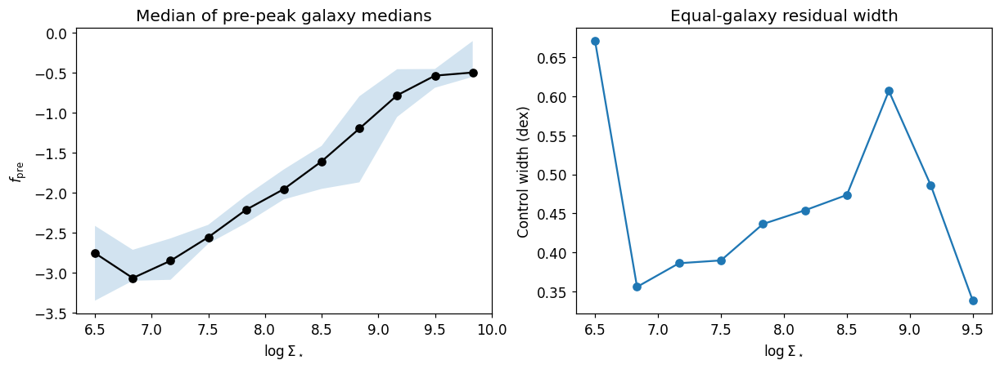

**Control interpretation:** the shaded range is galaxy-to-galaxy scatter, not a confidence interval. This internal pre-peak reference is unchanged from Q3; positive residuals mean above this control, not proof of externally triggered SF.

In [7]:
fig, axes = plt.subplots(1, 2, figsize=(11, 4), layout='constrained')
ref = prepeak_reference.loc[prepeak_reference.supported]
axes[0].plot(ref.sigma_center, ref.reference, 'o-', color='black')
axes[0].fill_between(ref.sigma_center, ref.galaxy_p16, ref.galaxy_p84, alpha=.2)
axes[0].set(xlabel=r'$\log\Sigma_\star$', ylabel=r'$f_{\rm pre}$', title='Median of pre-peak galaxy medians')
axes[1].plot(control_scatter.sigma_center, control_scatter.sigma_pre, 'o-')
axes[1].set(xlabel=r'$\log\Sigma_\star$', ylabel='Control width (dex)', title='Equal-galaxy residual width')
plt.show()
display(Markdown('**Control interpretation:** the shaded range is galaxy-to-galaxy scatter, '
    'not a confidence interval. This internal pre-peak reference is unchanged from Q3; '
    'positive residuals mean above this control, not proof of externally triggered SF.'))

## 5. Local reference, spatial support and coordinate conventions

For each galaxy, $f_g$ is its own median $y$ in the same stellar-density bins,
requiring 20 pixels/bin. Interpolate between adjacent supported centres, with
no extrapolation or interpolation across missing bins:
$$\delta_{\rm local}=y-f_g(x).$$
This removes the galaxy's own first-order density trend, not every radial trend.
The environmental mask requires finite $\Delta_{\rm env}$ and $z_{\rm env}$;
the **joint mask** also requires finite $\delta_{\rm local}$. All four directional
curves use this same joint mask so comparisons do not change spatial support.
The maps retain their native valid support, with missing values distinct from zero.

Sky PA is $\operatorname{atan2}(E,N)$, east of north; N/E/S/W = 0/90/180/270 degrees.
Original pixels are retained without warping or resampling. Catalogue elliptical
$R/R_e$ is used only for the optional radial shuffle. NGC4567/8 retains the inherited
union geometry and Q3 product weight. Both component centres are marked in its map,
but no single direction or additional independent-galaxy count is invented for it.

In [8]:
def interpolate_contiguous(x, centres, values, support):
    x = np.asarray(x, dtype=float)
    result = np.full(x.shape, np.nan)
    for j in range(len(centres)-1):
        if support[j] and support[j+1]:
            take = (x >= centres[j]) & (x <= centres[j+1])
            result[take] = np.interp(x[take], centres[j:j+2], values[j:j+2])
    return result


spatial = {}
support_rows = []
for row in q4_sample.itertuples(index=False):
    maps = load_galaxy_maps(row, geometry, SFR_HDU_PRIMARY)
    _, header = load_fits_map(row.mass_path, MASS_HDU, return_header=True)
    shape = maps['log_sigma_star'].shape
    sf_flat = np.flatnonzero(maps['sf_mask'])
    x = maps['log_sigma_star'].ravel()[sf_flat].astype(np.float32)
    y = maps['log_sigma_sfr'].ravel()[sf_flat].astype(np.float32)
    keep = np.isfinite(x) & np.isfinite(y) & (x >= sigma_edges[0]) & (x < sigma_edges[-1])
    flat_index = sf_flat[keep]
    payload = spaxels[row.GALID]
    # Assert the exact Q3 ordering before projecting its residuals back to pixels.
    np.testing.assert_array_equal(x[keep], payload['x'])
    np.testing.assert_array_equal(y[keep], payload['y'])
    own = reference_by_galaxy.loc[reference_by_galaxy.GALID.eq(row.GALID)].sort_values('sigma_bin')
    own_values = own.galaxy_median_logSigmaSFR.to_numpy()
    own_supported = np.isfinite(own_values)
    local_reference = interpolate_contiguous(payload['x'], sigma_centres, own_values, own_supported)
    local = payload['y'].astype(float) - local_reference
    for key, values in [('delta_env', payload['delta']), ('z_env', payload['z']), ('delta_local', local)]:
        arr = np.full(shape, np.nan)
        arr.ravel()[flat_index] = values
        maps[key] = arr
    env = maps['sf_mask'] & np.isfinite(maps['delta_env']) & np.isfinite(maps['z_env'])
    joint = env & np.isfinite(maps['delta_local'])
    comp = geometry.loc[geometry.notebook_product_id.eq(row.GALID)].copy()
    yy, xx = np.indices(shape, dtype=float)
    ra, dec = WCS(header).celestial.pixel_to_world_values(xx, yy)
    if len(comp) == 1:
        c = comp.iloc[0]
        east, north = tangent_offsets_arcsec(ra, dec, c.center_ra_deg, c.center_dec_deg)
        pixel_pa = np.mod(np.rad2deg(np.arctan2(east, north)), 360)
        # A pixel exactly at the centre has no meaningful direction.
        pixel_pa[np.hypot(east, north) < 1e-8] = np.nan
    else:
        c = comp.iloc[0]  # reference origin for display only; NOT a direction centre
        east, north = tangent_offsets_arcsec(ra, dec, c.center_ra_deg, c.center_dec_deg)
        pixel_pa = np.full(shape, np.nan)
    maps.update(header=header, components=comp, east=east, north=north, pixel_pa=pixel_pa,
                environment_mask=env, joint_mask=joint,
                local_reference=local_reference, own_values=own_values,
                stage=row.stage, inclination=row.inclination)
    for key in ['ew_ha', 'halpha_sigma_intrinsic', 'mass_bin_id', 'gas_bin_id',
                'ngist_mask', 'classification_mask']:
        maps.pop(key, None)
    spatial[row.GALID] = maps
    support_rows.append(dict(GALID=row.GALID, stage=row.stage, inclination=row.inclination,
        N_Q3_mass_range=len(flat_index), N_env=int(env.sum()),
        N_local=int(np.isfinite(maps['delta_local']).sum()), N_joint=int(joint.sum()),
        joint_fraction_of_env=float(joint.sum()/env.sum()) if env.any() else np.nan,
        N_local_supported_bins=int(own_supported.sum()),
        multiple_centres=len(comp) != 1,
        N_env_colour_clipped=int(np.count_nonzero(np.abs(maps['delta_env']) > RESIDUAL_VLIM)),
        N_local_colour_clipped=int(np.count_nonzero(np.abs(maps['delta_local']) > RESIDUAL_VLIM))))
map_support = pd.DataFrame(support_rows)
display(map_support)
print('Q3 vector-to-map identity verified for every eligible product.')

Q3 vector-to-map identity verified for every eligible product.


,GALID,stage,inclination,N_Q3_mass_range,N_env,N_local,N_joint,joint_fraction_of_env,N_local_supported_bins,multiple_centres,N_env_colour_clipped,N_local_colour_clipped
0,IC3392,post-peak,68,13897,13897,13868,13868,0.997913,5,False,99,143
1,NGC4064,post-peak,70,3273,3273,3213,3213,0.981668,4,False,396,287
2,NGC4189,pre-peak,42,96364,96364,96357,96357,0.999927,6,False,4539,4823
3,NGC4254,pre-peak,39,661963,658873,658991,658873,1.000000,11,False,96842,52759
4,NGC4293,post-peak,67,471,471,310,310,0.658174,2,False,4,11
5,NGC4294,pre-peak,74,68833,68833,68798,68798,0.999492,7,False,3982,2476
6,NGC4298,close-to-peak,52,144157,144157,144120,144120,0.999743,7,False,4504,5808
7,NGC4321,pre-peak,32,454131,454110,454129,454110,1.000000,9,False,33236,34168
8,NGC4351,pre-peak,48,30711,30711,30613,30613,0.996809,6,False,552,320
9,NGC4380,post-peak,61,64097,64097,61825,61825,0.964554,5,False,9723,1436


## 6. Five-panel map gallery for every Q3-eligible product: no H I arrows

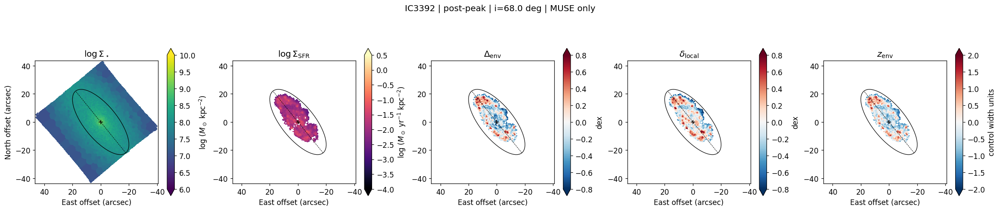

**IC3392 interpretation:** the environmental median is -0.115 dex; the common directional support retains 99.8% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 99, 143, 7]; numerical analysis uses unclipped values.

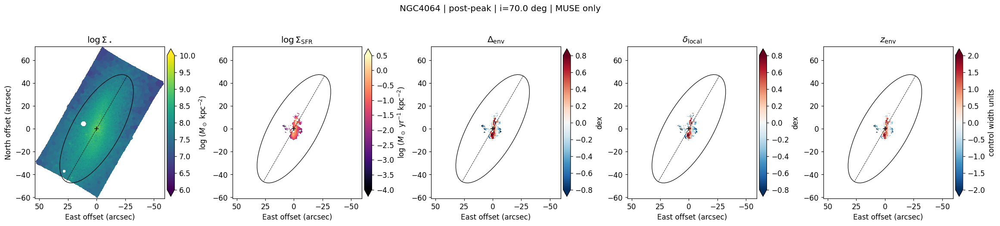

**NGC4064 interpretation:** the environmental median is +0.105 dex; the common directional support retains 98.2% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 396, 287, 131]; numerical analysis uses unclipped values.

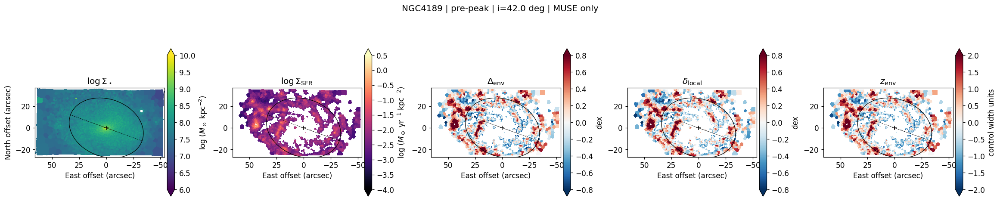

**NGC4189 interpretation:** the environmental median is +0.002 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 4539, 4823, 3586]; numerical analysis uses unclipped values.

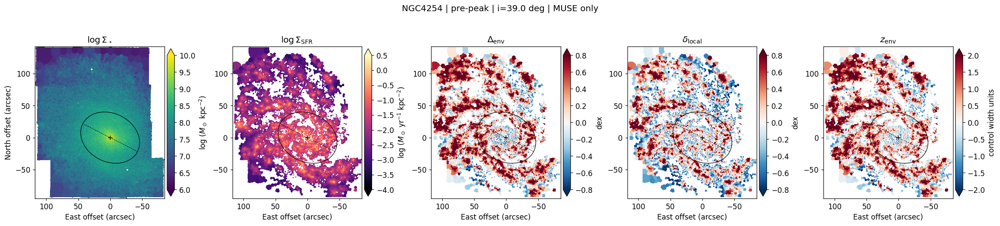

**NGC4254 interpretation:** the environmental median is +0.245 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [27, 0, 96842, 52759, 90531]; numerical analysis uses unclipped values.

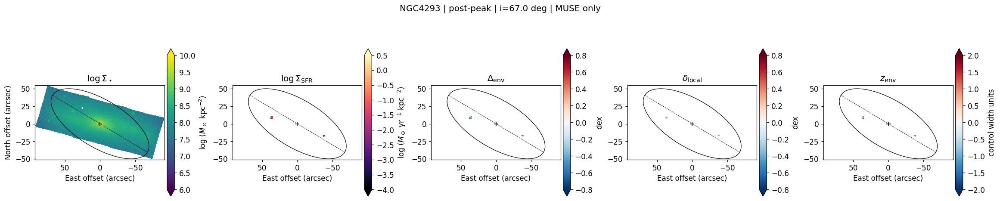

**NGC4293 interpretation:** the environmental median is -0.373 dex; the common directional support retains 65.8% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [31, 0, 4, 11, 0]; numerical analysis uses unclipped values.

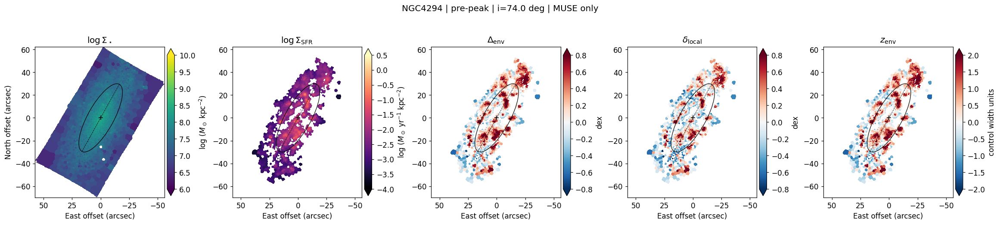

**NGC4294 interpretation:** the environmental median is +0.100 dex; the common directional support retains 99.9% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 3982, 2476, 3939]; numerical analysis uses unclipped values.

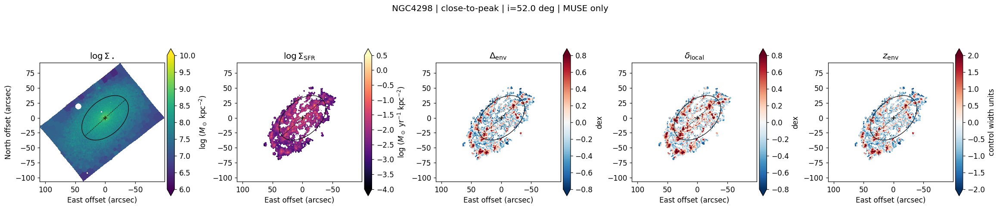

**NGC4298 interpretation:** the environmental median is -0.138 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 4504, 5808, 2589]; numerical analysis uses unclipped values.

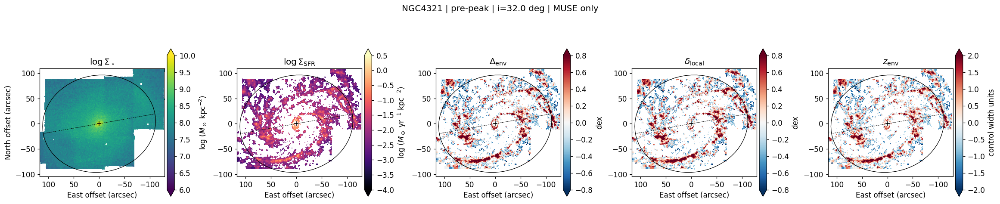

**NGC4321 interpretation:** the environmental median is -0.015 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [193, 22, 33236, 34168, 23968]; numerical analysis uses unclipped values.

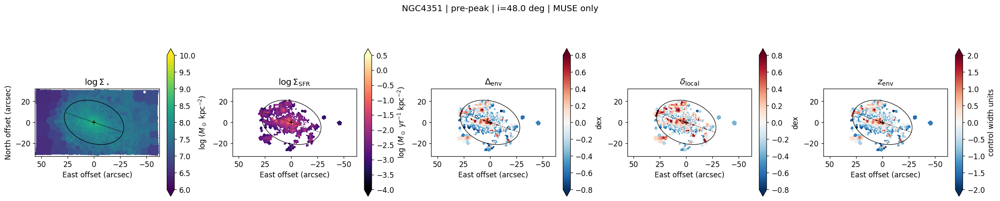

**NGC4351 interpretation:** the environmental median is -0.182 dex; the common directional support retains 99.7% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 552, 320, 398]; numerical analysis uses unclipped values.

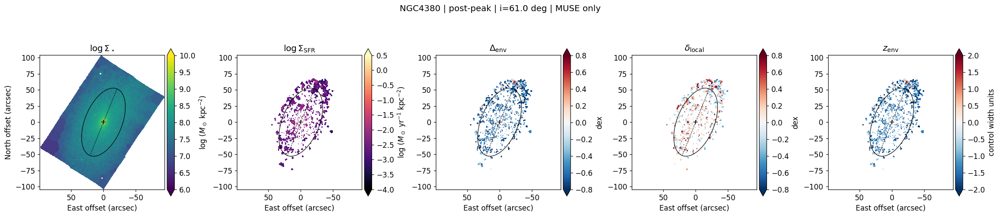

**NGC4380 interpretation:** the environmental median is -0.536 dex; the common directional support retains 96.5% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [6, 0, 9723, 1436, 6332]; numerical analysis uses unclipped values.

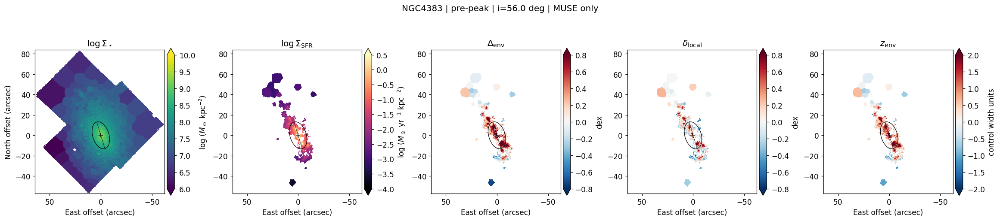

**NGC4383 interpretation:** the environmental median is +0.067 dex; the common directional support retains 99.5% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [6519, 28, 1525, 375, 774]; numerical analysis uses unclipped values.

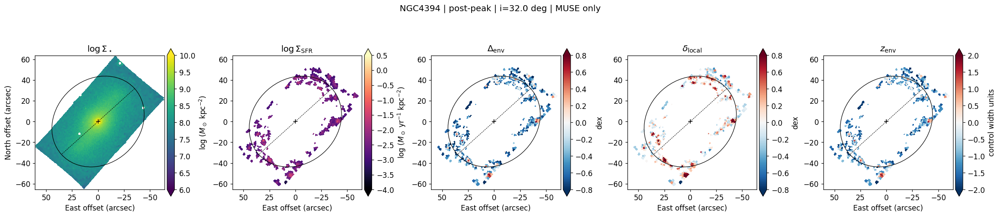

**NGC4394 interpretation:** the environmental median is -0.505 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [251, 0, 3503, 918, 1452]; numerical analysis uses unclipped values.

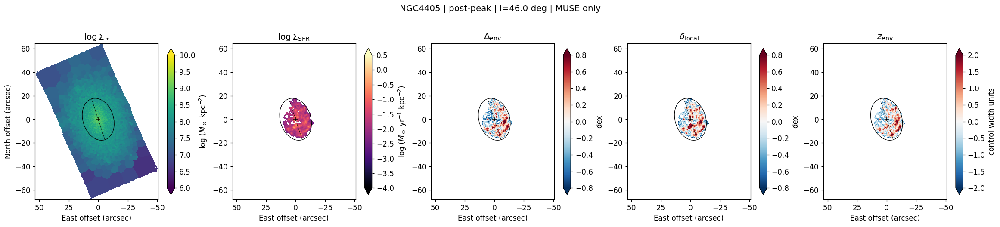

**NGC4405 interpretation:** the environmental median is -0.020 dex; the common directional support retains 99.4% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 458, 406, 177]; numerical analysis uses unclipped values.

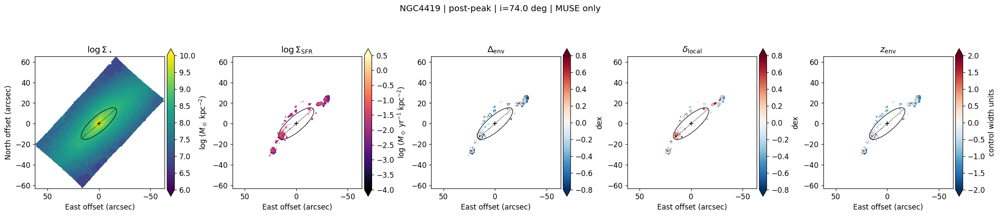

**NGC4419 interpretation:** the environmental median is -0.266 dex; the common directional support retains 96.4% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [103, 0, 266, 148, 94]; numerical analysis uses unclipped values.

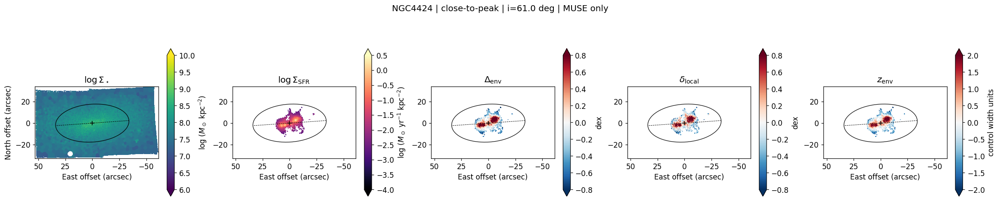

**NGC4424 interpretation:** the environmental median is -0.040 dex; the common directional support retains 98.6% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 904, 777, 564]; numerical analysis uses unclipped values.

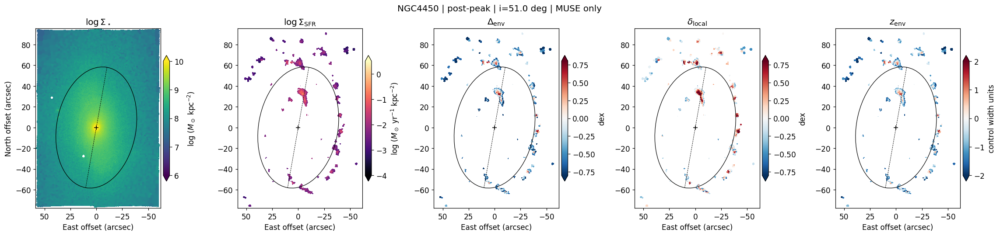

**NGC4450 interpretation:** the environmental median is -0.447 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [383, 0, 2443, 712, 1135]; numerical analysis uses unclipped values.

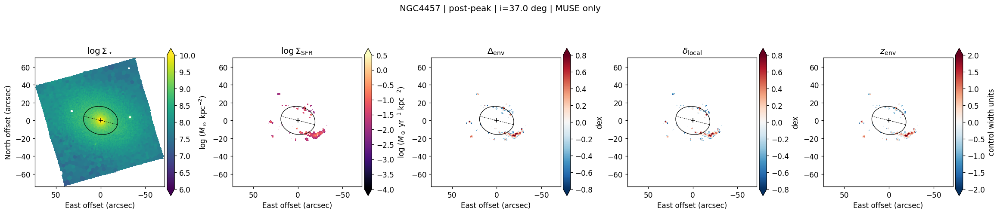

**NGC4457 interpretation:** the environmental median is +0.011 dex; the common directional support retains 98.7% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [469, 0, 239, 156, 83]; numerical analysis uses unclipped values.

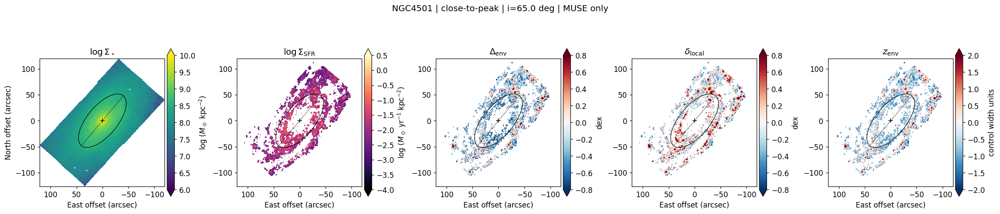

**NGC4501 interpretation:** the environmental median is -0.242 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [607, 0, 10659, 8513, 2997]; numerical analysis uses unclipped values.

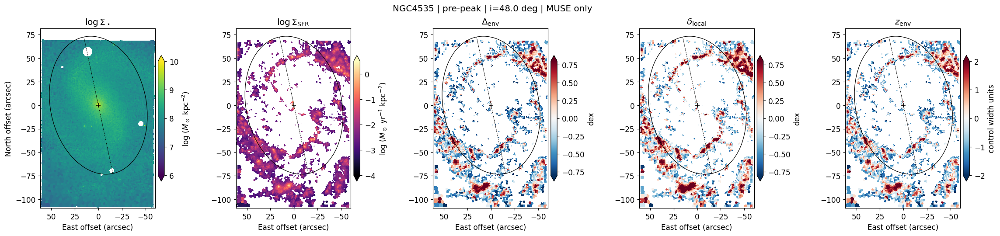

**NGC4535 interpretation:** the environmental median is -0.194 dex; the common directional support retains 99.8% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [15, 0, 17951, 17938, 10768]; numerical analysis uses unclipped values.

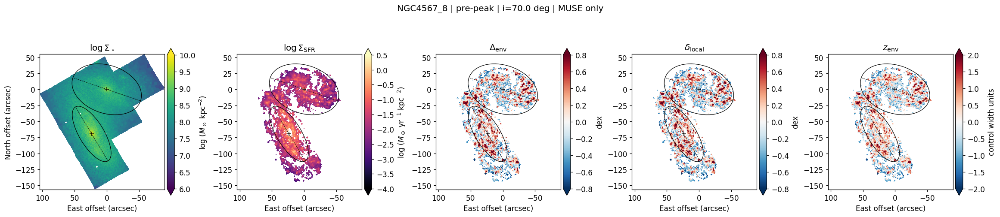

**NGC4567_8 interpretation:** the environmental median is -0.005 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [56, 11, 8816, 8942, 4430]; numerical analysis uses unclipped values. **Two centres: maps only, no single direction assigned.**

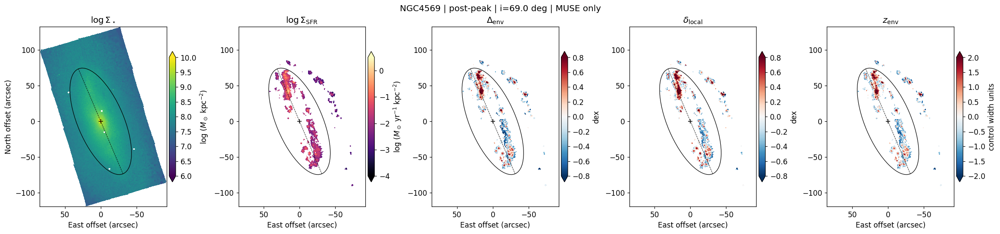

**NGC4569 interpretation:** the environmental median is -0.078 dex; the common directional support retains 99.7% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [128, 0, 3463, 3289, 1892]; numerical analysis uses unclipped values.

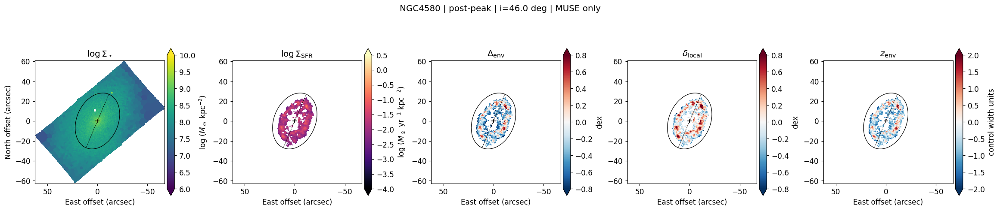

**NGC4580 interpretation:** the environmental median is -0.243 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 888, 364, 163]; numerical analysis uses unclipped values.

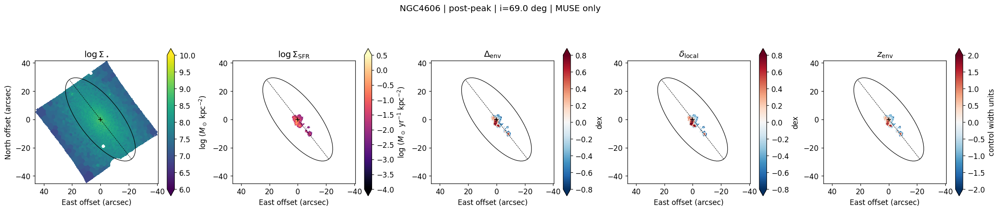

**NGC4606 interpretation:** the environmental median is -0.057 dex; the common directional support retains 96.7% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 81, 89, 23]; numerical analysis uses unclipped values.

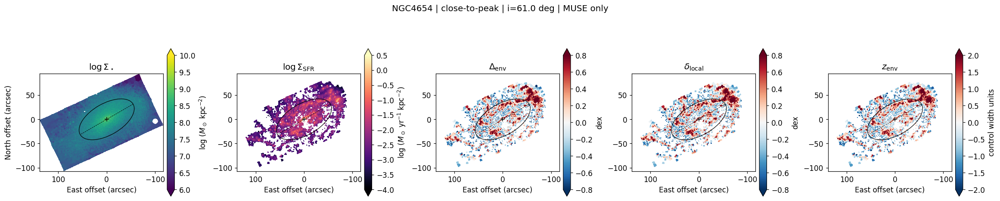

**NGC4654 interpretation:** the environmental median is -0.035 dex; the common directional support retains 100.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 21154, 22056, 18513]; numerical analysis uses unclipped values.

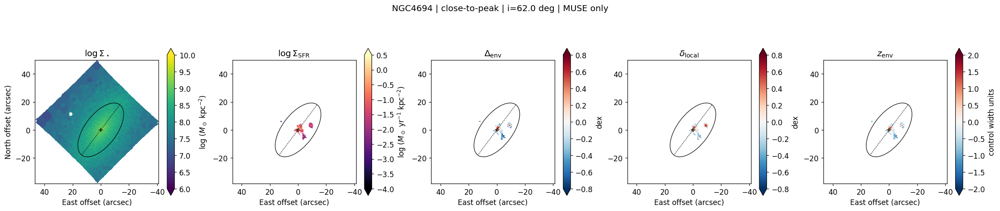

**NGC4694 interpretation:** the environmental median is -0.162 dex; the common directional support retains 91.0% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [0, 0, 30, 9, 0]; numerical analysis uses unclipped values.

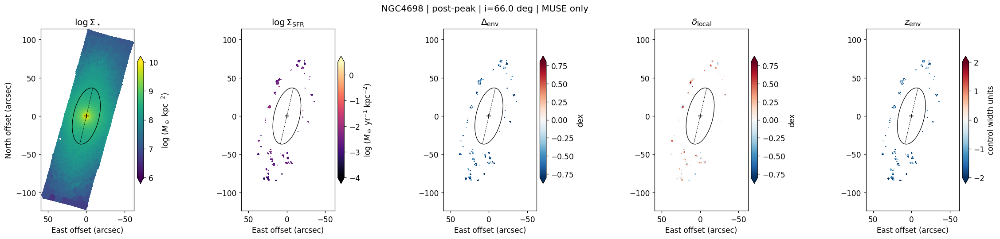

**NGC4698 interpretation:** the environmental median is -0.650 dex; the common directional support retains 99.2% of environmental pixels. Red in the local map means stronger than this galaxy's own density trend; only the environmental map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes and effective radii, not H I directions. Colour-clipped counts (panels 1--5): [200, 0, 1711, 97, 936]; numerical analysis uses unclipped values.

In [9]:
def decorate_blind_map(ax, maps):
    anchor = maps['components'].iloc[0]
    for c in maps['components'].itertuples(index=False):
        e, n = tangent_offsets_arcsec(c.center_ra_deg, c.center_dec_deg,
                                      anchor.center_ra_deg, anchor.center_dec_deg)
        ax.add_patch(Ellipse((e, n), 2*c.a_re_arcsec, 2*c.b_re_arcsec,
            angle=90-c.pa_deg_east_of_north, fill=False, edgecolor='black', lw=.8))
        a = np.deg2rad(c.pa_deg_east_of_north)
        ax.plot(e+np.array([-1,1])*c.a_re_arcsec*np.sin(a),
                n+np.array([-1,1])*c.a_re_arcsec*np.cos(a), 'k--', lw=.6)
        ax.plot(e,n,'k+',ms=7)
    ax.set_aspect('equal')
    ax.set_xlabel('East offset (arcsec)')
    ax.invert_xaxis()

map_gallery_rows = []
for galid, m in spatial.items():
    panel_data = [np.where(m['valid_disc_mask'],m['log_sigma_star'],np.nan),
                  np.where(m['sf_mask'],m['log_sigma_sfr'],np.nan),
                  m['delta_env'],m['delta_local'],m['z_env']]
    labels = [r'$\log\Sigma_\star$',r'$\log\Sigma_{\rm SFR}$',
              r'$\Delta_{\rm env}$',r'$\delta_{\rm local}$',r'$z_{\rm env}$']
    ranges = [(6,10),(-4,.5),(-RESIDUAL_VLIM,RESIDUAL_VLIM),
              (-RESIDUAL_VLIM,RESIDUAL_VLIM),(-Z_VLIM,Z_VLIM)]
    units = [r'log ($M_\odot$ kpc$^{-2}$)',r'log ($M_\odot$ yr$^{-1}$ kpc$^{-2}$)',
             'dex','dex','control width units']
    fig, axes = plt.subplots(1,5,figsize=(21,4.8),layout='constrained')
    for ax,data,label,limits,cmap,unit in zip(axes,panel_data,labels,ranges,
                                            ['viridis','magma','RdBu_r','RdBu_r','RdBu_r'],units):
        im=ax.pcolormesh(m['east'],m['north'],np.ma.masked_invalid(data),
            shading='nearest',cmap=cmap,vmin=limits[0],vmax=limits[1],rasterized=True)
        decorate_blind_map(ax,m)
        ax.set_title(label)
        fig.colorbar(im,ax=ax,shrink=.70,pad=.02,extend='both',label=unit)
    axes[0].set_ylabel('North offset (arcsec)')
    fig.suptitle(f'{galid} | {m["stage"]} | i={m["inclination"]:.1f} deg | MUSE only',fontsize=13)
    plt.show()
    median = float(np.nanmedian(m['delta_env']))
    q = map_support.loc[map_support.GALID.eq(galid)].iloc[0]
    clipping = [int(np.count_nonzero(np.isfinite(d)&((d<lo)|(d>hi))))
                for d,(lo,hi) in zip(panel_data,ranges)]
    map_gallery_rows.append(dict(GALID=galid,median_env=median,clipped_pixels=clipping))
    display(Markdown(f'**{galid} interpretation:** the environmental median is {median:+.3f} dex; '
        f'the common directional support retains {q.joint_fraction_of_env:.1%} of environmental pixels. '
        'Red in the local map means stronger than this galaxy\'s own density trend; only the environmental '
        'map establishes whether it is above control. The dashed lines and ellipses mark stellar major axes '
        'and effective radii, not H I directions. '
        f'Colour-clipped counts (panels 1--5): {clipping}; numerical analysis uses unclipped values.'
        + (' **Two centres: maps only, no single direction assigned.**' if q.multiple_centres else '')))
map_gallery_summary = pd.DataFrame(map_gallery_rows)

## 7. Full sky-angle scan, before introducing H I metadata

For a trial PA $\theta$, define plus and minus hemispheres using the sign of
$\cos(\phi-\theta)$. Pixels exactly on the dividing line (numerical tolerance
$10^{-10}$ degrees), or at the centre, are omitted. Each side needs 20 joint-mask pixels.
$$A_X(\theta)={\rm median}(X)_+-{\rm median}(X)_-,\quad
X\in\{\Delta_{\rm env},\delta_{\rm local},z_{\rm env}\},$$
$$A_{\rm enh}(\theta)=P(z_{\rm env}>1\mid+)-P(z_{\rm env}>1\mid-).$$
These are hemisphere contrasts, not spatial derivatives in dex/kpc. Fractions count
selected spaxels (area at fixed sampling), not independent H II regions.
The primary direction is $\theta_{\rm SF}=\arg\max A_{\rm local}$.
For every metric retain its own maximum, preferred/opposite medians or fractions,
side counts, and all 360 curve values. Also evaluate **all metrics at $\theta_{\rm SF}$**.

Opposite angles swap the same two sides, so $A(\theta+180)=-A(\theta)$ exactly.
No angular smoothing or pixel subsampling is used. Exact tied maxima use the first
grid PA for bookkeeping; the full set is retained and no unique-peak alignment
classification is made for such ties. The set above 95% of the maximum measures
descriptive breadth only, not angular uncertainty. Flat zero curves have no direction.

**Median-contrast degeneracy:** the independent synthetic check used uniformly
spaced sky azimuths with an eastward cosine residual. Its exact hemisphere-median
maximum spans PA 45--135 degrees even though the underlying dipole points east.
Thus an exact plateau need not mean weak asymmetry; it means this median statistic
does not uniquely determine the direction. We retain the prescribed median statistic
and flag the ambiguity rather than silently replacing it with a mean or choosing
the member of the plateau closest to the H I sector.


In [10]:
METRICS = ('local','env','z','enh')
METRIC_LABELS = {'local':r'$A_{\rm local}$ (dex)','env':r'$A_{\rm env}$ (dex)',
                 'z':r'$A_z$','enh':r'$A_{\rm enh}$ (fraction)'}

def angle_distance(a,b):
    return np.abs((np.asarray(a)-np.asarray(b)+180)%360-180)

def scan_arrays(pa, values, width=180, min_side=MIN_SIDE_PIXELS):
    pa = np.asarray(pa,dtype=float)
    values = np.asarray(values,dtype=float)
    assert values.shape == (pa.size,3)  # local, env, z on identical support
    if width not in (90,180):
        raise ValueError('Supported full sector widths: 90 or 180 degrees')
    out = {k:np.full((360,2),np.nan) for k in METRICS}
    counts = np.zeros((360,2),dtype=int)
    for j in range(180):
        sep = (pa-j+180)%360-180
        plus = np.abs(sep) < width/2-1e-10
        minus = np.abs(sep) > 180-width/2+1e-10
        counts[j] = [plus.sum(),minus.sum()]
        counts[j+180] = counts[j,::-1]
        if min(counts[j]) < min_side:
            continue
        for side, select in enumerate((plus,minus)):
            med = np.median(values[select],axis=0)
            for k,v in zip(('local','env','z'),med):
                out[k][j,side] = v
            out['enh'][j,side] = np.mean(values[select,2]>1)
        for k in METRICS:
            out[k][j+180] = out[k][j,::-1]
    return {'sides':out,'A':{k:v[:,0]-v[:,1] for k,v in out.items()},'counts':counts}

def peak_summary(curve, metric):
    a = curve['A'][metric]
    good = np.isfinite(a)
    base = dict(theta_deg=np.nan,A_max=np.nan,M_plus=np.nan,M_minus=np.nan,
        N_plus=0,N_minus=0,valid_angle_fraction=float(good.mean()),peak_defined=False,
        exact_peak_count=0,exact_peak_angles=[],near_peak_angles=[],near_peak_fraction=np.nan,
        near_peak_span_deg=np.nan,unique_peak=False)
    if not good.any():
        return base
    vmax = float(np.nanmax(a))
    base['A_max'] = vmax
    if vmax <= 1e-12:
        return base
    peaks = np.flatnonzero(np.isclose(a,vmax,rtol=0,atol=1e-12))
    near = np.flatnonzero(good & (a >= PEAK_FRACTION*vmax))
    j = int(peaks[0])
    base.update(theta_deg=float(j),M_plus=float(curve['sides'][metric][j,0]),
        M_minus=float(curve['sides'][metric][j,1]),N_plus=int(curve['counts'][j,0]),
        N_minus=int(curve['counts'][j,1]),peak_defined=True,exact_peak_count=len(peaks),
        exact_peak_angles=peaks.tolist(),unique_peak=len(peaks)==1,
        near_peak_angles=near.tolist(),near_peak_fraction=len(near)/360,
        near_peak_span_deg=float(360-np.max(np.diff(np.r_[near,near[0]+360]))))
    return base

curves, curves90, direction_inputs, rows, excluded_rows = {}, {}, {}, [], []
for galid,m in spatial.items():
    if len(m['components']) != 1:
        excluded_rows.append(dict(GALID=galid,reason='multiple physical centres in one Q3 product'))
        continue
    joint = m['joint_mask'] & np.isfinite(m['pixel_pa'])
    pa = m['pixel_pa'][joint]
    values = np.column_stack([m['delta_local'][joint],m['delta_env'][joint],m['z_env'][joint]])
    direction_inputs[galid] = dict(pa=pa,values=values,radius=m['radius_re'][joint])
    curve = scan_arrays(pa,values)
    curves[galid] = curve
    if RUN_90_DEG_SECTORS:
        curves90[galid] = scan_arrays(pa,values,width=90)
    for metric in METRICS:
        rows.append(dict(GALID=galid,stage=m['stage'],metric=metric,**peak_summary(curve,metric)))
    print(f'{galid}: {len(pa):,} joint pixels; {np.isfinite(curve["A"]["local"]).mean():.0%} of angles supported')
direction_summary = pd.DataFrame(rows)
direction_exclusions = pd.DataFrame(excluded_rows,columns=['GALID','reason'])
preferred_rows = []
for row in direction_summary.loc[direction_summary.metric.eq('local')].itertuples(index=False):
    record = dict(GALID=row.GALID,stage=row.stage,theta_SF=row.theta_deg,A_local_max=row.A_max,
        peak_defined=row.peak_defined,unique_peak=row.unique_peak,
        valid_angle_fraction=row.valid_angle_fraction,near_peak_span_deg=row.near_peak_span_deg)
    for k in METRICS:
        record.update({f'{k}_plus':np.nan,f'{k}_minus':np.nan,f'A_{k}_at_SF':np.nan})
    if row.peak_defined:
        j=int(row.theta_deg)
        for k in METRICS:
            record[f'{k}_plus'],record[f'{k}_minus']=curves[row.GALID]['sides'][k][j]
            record[f'A_{k}_at_SF']=curves[row.GALID]['A'][k][j]
    preferred_rows.append(record)
preferred_sides = pd.DataFrame(preferred_rows)
# A reproducible freeze of the inferred result before loading any H I sector.
INFERENCE_SHA256 = hashlib.sha256(direction_summary.to_json(orient='records').encode()).hexdigest()
display(direction_summary.drop(columns=['exact_peak_angles','near_peak_angles']))
display(preferred_sides)
display(direction_exclusions)
print('MUSE inference checksum:',INFERENCE_SHA256)

IC3392: 13,868 joint pixels; 100% of angles supported
NGC4064: 3,213 joint pixels; 100% of angles supported
NGC4189: 96,357 joint pixels; 100% of angles supported
NGC4254: 658,873 joint pixels; 100% of angles supported
NGC4293: 310 joint pixels; 96% of angles supported
NGC4294: 68,798 joint pixels; 100% of angles supported
NGC4298: 144,120 joint pixels; 100% of angles supported
NGC4321: 454,110 joint pixels; 100% of angles supported
NGC4351: 30,613 joint pixels; 100% of angles supported
NGC4380: 61,825 joint pixels; 100% of angles supported
NGC4383: 25,074 joint pixels; 100% of angles supported
NGC4394: 31,915 joint pixels; 100% of angles supported
NGC4405: 13,489 joint pixels; 100% of angles supported
NGC4419: 5,556 joint pixels; 100% of angles supported
NGC4424: 8,868 joint pixels; 100% of angles supported
NGC4450: 17,186 joint pixels; 100% of angles supported
NGC4457: 5,530 joint pixels; 100% of angles supported
NGC4501: 251,898 joint pixels; 100% of angles supported
NGC4535: 186,71

,GALID,stage,metric,theta_deg,A_max,M_plus,M_minus,N_plus,N_minus,valid_angle_fraction,peak_defined,exact_peak_count,near_peak_fraction,near_peak_span_deg,unique_peak
0,IC3392,post-peak,local,124.0,0.144588,0.062925,-0.081663,6317,7551,1.0,True,1,0.044444,15.0,True
1,IC3392,post-peak,env,121.0,0.130140,-0.048866,-0.179006,6488,7380,1.0,True,1,0.058333,20.0,True
2,IC3392,post-peak,z,114.0,0.277027,-0.104171,-0.381198,6862,7006,1.0,True,1,0.058333,20.0,True
3,IC3392,post-peak,enh,111.0,0.057959,0.082857,0.024898,7000,6868,1.0,True,1,0.022222,7.0,True
4,NGC4064,post-peak,local,262.0,0.276359,0.101907,-0.174452,2210,1003,1.0,True,1,0.025000,8.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,NGC4694,close-to-peak,enh,36.0,0.086684,0.102837,0.016153,282,681,1.0,True,1,0.036111,14.0,True
96,NGC4698,post-peak,local,72.0,0.128835,0.074013,-0.054822,3835,2855,1.0,True,1,0.013889,5.0,True
97,NGC4698,post-peak,env,75.0,0.136204,-0.606144,-0.742349,4342,2348,1.0,True,2,0.013889,9.0,False
98,NGC4698,post-peak,z,72.0,0.320662,-1.374001,-1.694663,3835,2855,1.0,True,1,0.008333,5.0,True


,GALID,stage,theta_SF,A_local_max,peak_defined,unique_peak,valid_angle_fraction,near_peak_span_deg,local_plus,local_minus,A_local_at_SF,env_plus,env_minus,A_env_at_SF,z_plus,z_minus,A_z_at_SF,enh_plus,enh_minus,A_enh_at_SF
0,IC3392,post-peak,124.0,0.144588,True,True,1.000000,15.0,0.062925,-0.081663,0.144588,-0.047415,-0.176885,0.129470,-0.103179,-0.374165,0.270986,0.073769,0.037743,0.036026
1,NGC4064,post-peak,262.0,0.276359,True,True,1.000000,8.0,0.101907,-0.174452,0.276359,0.198479,-0.051693,0.250172,0.370070,-0.094842,0.464912,0.255204,0.110668,0.144536
2,NGC4189,pre-peak,51.0,0.074130,True,True,1.000000,3.0,0.041687,-0.032443,0.074130,0.038211,-0.052772,0.090983,0.096406,-0.120958,0.217364,0.204125,0.146360,0.057765
3,NGC4254,pre-peak,102.0,0.116033,True,True,1.000000,25.0,0.042823,-0.073210,0.116033,0.301891,0.163090,0.138802,0.725755,0.381530,0.344225,0.406992,0.287894,0.119099
4,NGC4293,post-peak,156.0,0.196543,True,False,0.961111,168.0,-0.079295,-0.275838,0.196543,-0.459611,-0.559740,0.100129,-0.970451,-1.233292,0.262841,0.041509,0.000000,0.041509
5,NGC4294,pre-peak,260.0,0.199812,True,True,1.000000,3.0,0.111629,-0.088184,0.199812,0.236583,0.012706,0.223877,0.602227,0.032105,0.570122,0.350221,0.152378,0.197843
6,NGC4298,close-to-peak,87.0,0.080533,True,True,1.000000,6.0,0.026029,-0.054504,0.080533,-0.105449,-0.182714,0.077264,-0.242228,-0.413110,0.170882,0.120537,0.074966,0.045571
7,NGC4321,pre-peak,199.0,0.086546,True,True,1.000000,23.0,0.056862,-0.029684,0.086546,0.036293,-0.054396,0.090690,0.080372,-0.123514,0.203886,0.213632,0.159279,0.054353
8,NGC4351,pre-peak,39.0,0.231109,True,False,1.000000,13.0,0.073176,-0.157934,0.231109,-0.101940,-0.278114,0.176174,-0.237722,-0.672039,0.434317,0.088553,0.043563,0.044990
9,NGC4380,post-peak,66.0,0.056091,True,True,1.000000,5.0,0.015201,-0.040891,0.056091,-0.500690,-0.571098,0.070408,-1.116841,-1.299141,0.182300,0.012400,0.007679,0.004721


,GALID,reason
0,NGC4567_8,multiple physical centres in one Q3 product


## 8. Complete directional curves: all stages, with side coverage

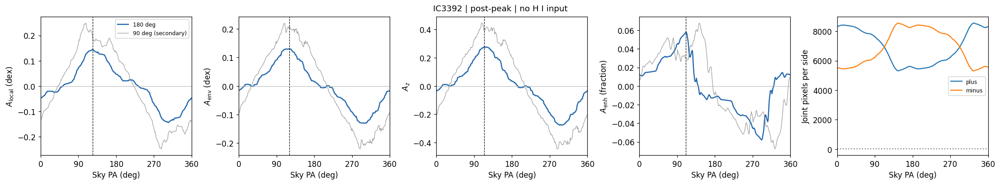

**IC3392 interpretation:** local maximum 0.145 dex at 124 deg; environmental medians on these same sides are -0.047 / -0.177 dex. The 95%-of-maximum PA set spans 15 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

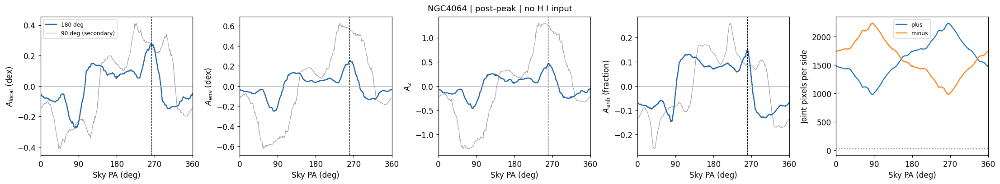

**NGC4064 interpretation:** local maximum 0.276 dex at 262 deg; environmental medians on these same sides are +0.198 / -0.052 dex. The 95%-of-maximum PA set spans 8 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

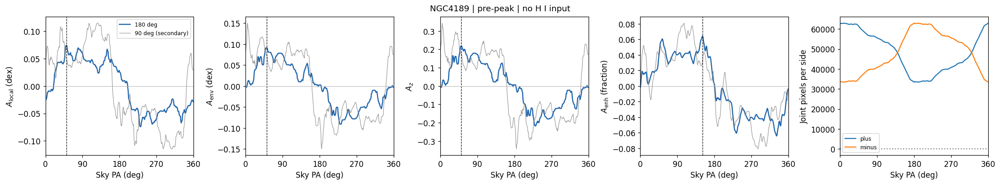

**NGC4189 interpretation:** local maximum 0.074 dex at 51 deg; environmental medians on these same sides are +0.038 / -0.053 dex. The 95%-of-maximum PA set spans 3 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

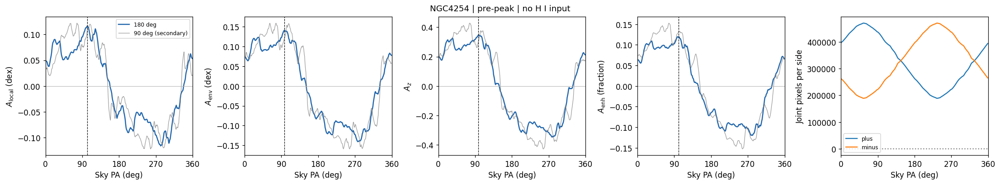

**NGC4254 interpretation:** local maximum 0.116 dex at 102 deg; environmental medians on these same sides are +0.302 / +0.163 dex. The 95%-of-maximum PA set spans 25 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

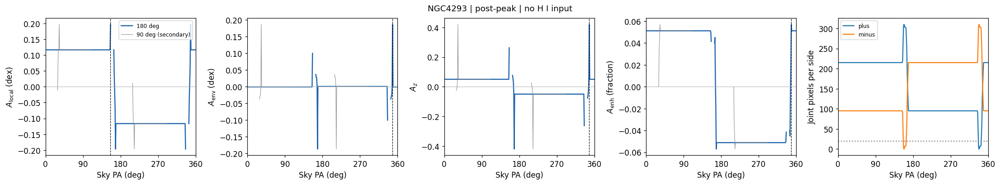

**NGC4293 interpretation:** local maximum 0.197 dex at 156 deg; environmental medians on these same sides are -0.460 / -0.560 dex. The 95%-of-maximum PA set spans 168 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

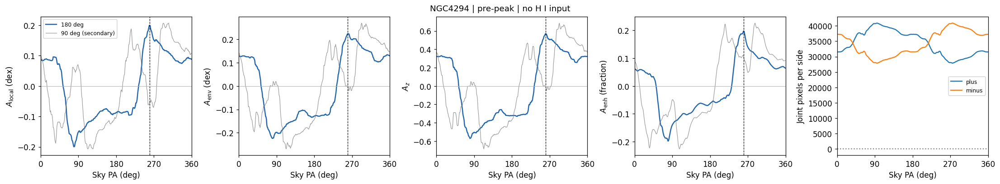

**NGC4294 interpretation:** local maximum 0.200 dex at 260 deg; environmental medians on these same sides are +0.237 / +0.013 dex. The 95%-of-maximum PA set spans 3 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

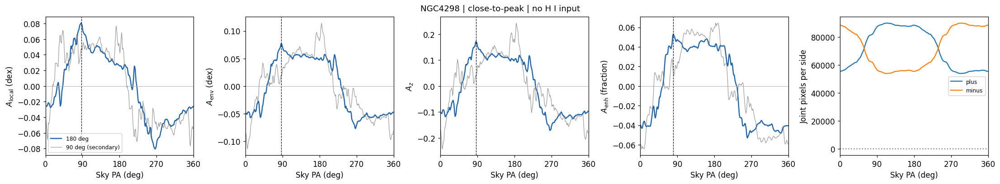

**NGC4298 interpretation:** local maximum 0.081 dex at 87 deg; environmental medians on these same sides are -0.105 / -0.183 dex. The 95%-of-maximum PA set spans 6 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

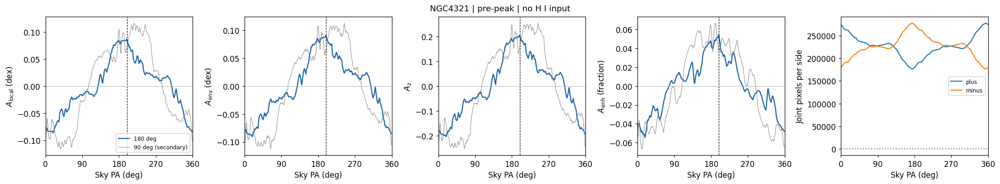

**NGC4321 interpretation:** local maximum 0.087 dex at 199 deg; environmental medians on these same sides are +0.036 / -0.054 dex. The 95%-of-maximum PA set spans 23 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

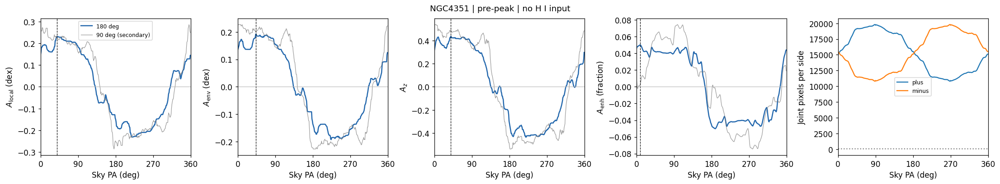

**NGC4351 interpretation:** local maximum 0.231 dex at 39 deg; environmental medians on these same sides are -0.102 / -0.278 dex. The 95%-of-maximum PA set spans 13 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

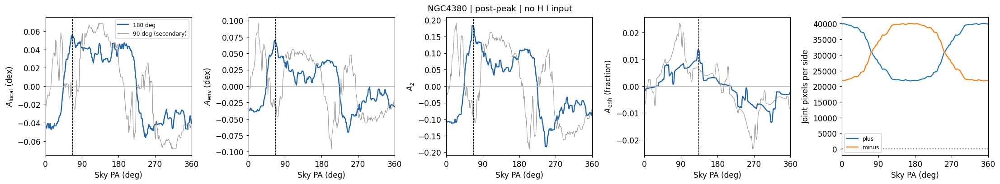

**NGC4380 interpretation:** local maximum 0.056 dex at 66 deg; environmental medians on these same sides are -0.501 / -0.571 dex. The 95%-of-maximum PA set spans 5 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

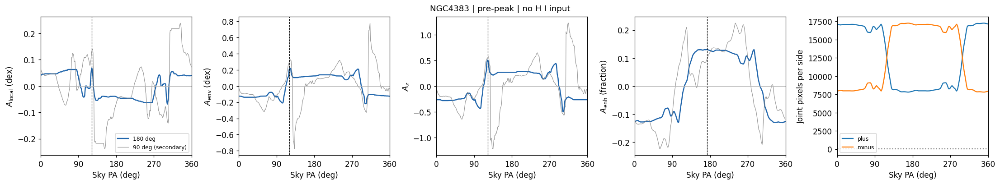

**NGC4383 interpretation:** local maximum 0.068 dex at 122 deg; environmental medians on these same sides are +0.222 / +0.004 dex. The 95%-of-maximum PA set spans 0 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

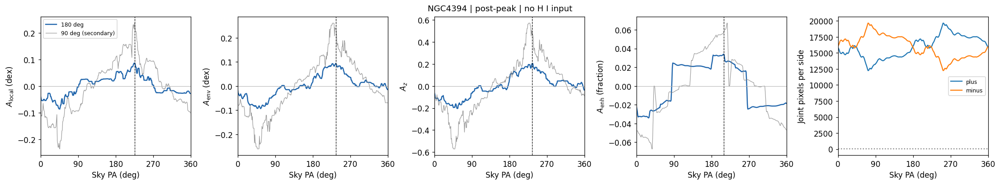

**NGC4394 interpretation:** local maximum 0.087 dex at 226 deg; environmental medians on these same sides are -0.457 / -0.549 dex. The 95%-of-maximum PA set spans 2 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

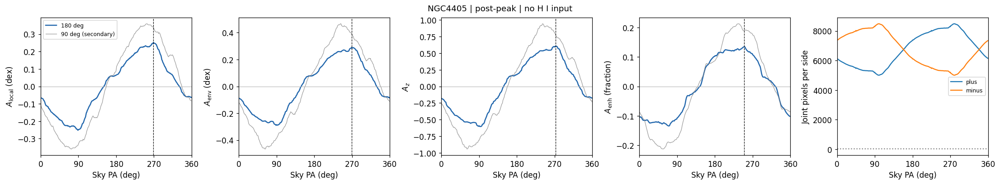

**NGC4405 interpretation:** local maximum 0.252 dex at 269 deg; environmental medians on these same sides are +0.097 / -0.193 dex. The 95%-of-maximum PA set spans 11 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

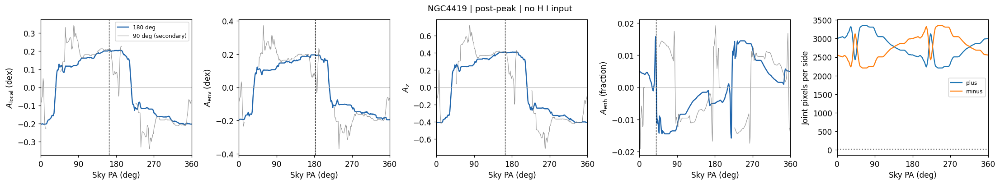

**NGC4419 interpretation:** local maximum 0.205 dex at 163 deg; environmental medians on these same sides are -0.173 / -0.366 dex. The 95%-of-maximum PA set spans 48 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

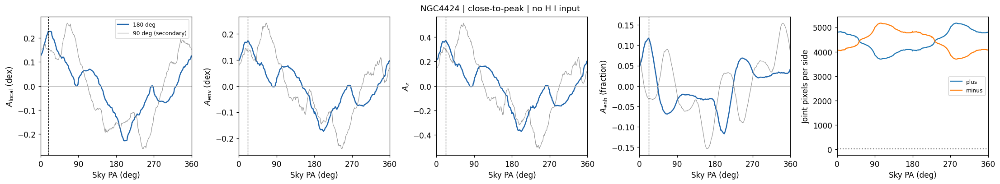

**NGC4424 interpretation:** local maximum 0.228 dex at 19 deg; environmental medians on these same sides are +0.052 / -0.114 dex. The 95%-of-maximum PA set spans 9 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

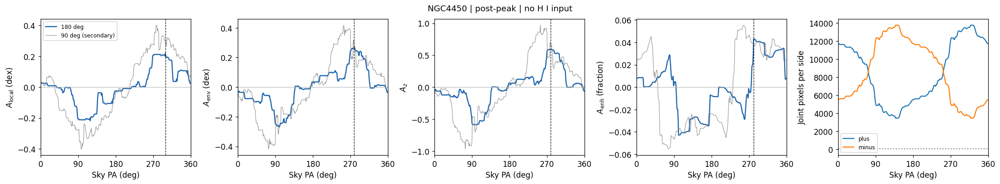

**NGC4450 interpretation:** local maximum 0.218 dex at 299 deg; environmental medians on these same sides are -0.400 / -0.611 dex. The 95%-of-maximum PA set spans 27 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

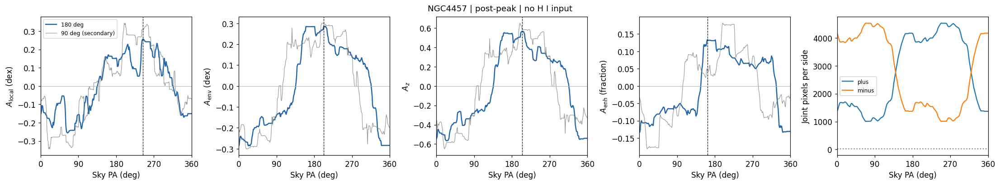

**NGC4457 interpretation:** local maximum 0.256 dex at 244 deg; environmental medians on these same sides are +0.040 / -0.147 dex. The 95%-of-maximum PA set spans 7 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

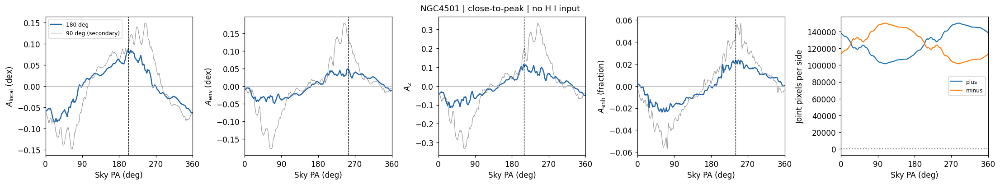

**NGC4501 interpretation:** local maximum 0.085 dex at 203 deg; environmental medians on these same sides are -0.223 / -0.260 dex. The 95%-of-maximum PA set spans 14 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

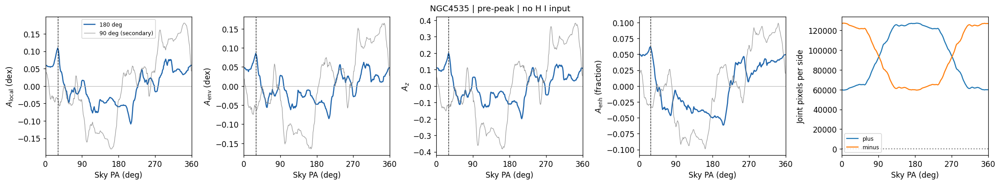

**NGC4535 interpretation:** local maximum 0.109 dex at 30 deg; environmental medians on these same sides are -0.133 / -0.219 dex. The 95%-of-maximum PA set spans 2 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

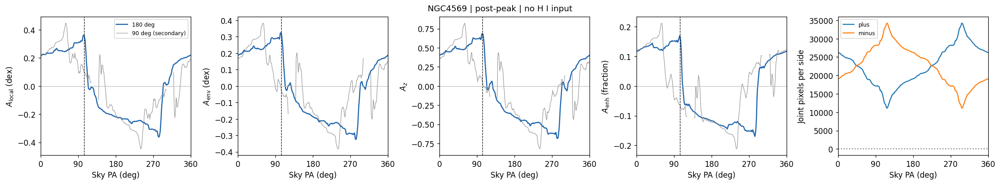

**NGC4569 interpretation:** local maximum 0.363 dex at 104 deg; environmental medians on these same sides are +0.139 / -0.185 dex. The 95%-of-maximum PA set spans 3 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

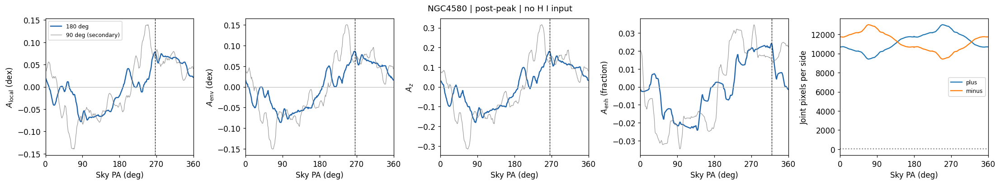

**NGC4580 interpretation:** local maximum 0.078 dex at 266 deg; environmental medians on these same sides are -0.207 / -0.293 dex. The 95%-of-maximum PA set spans 18 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

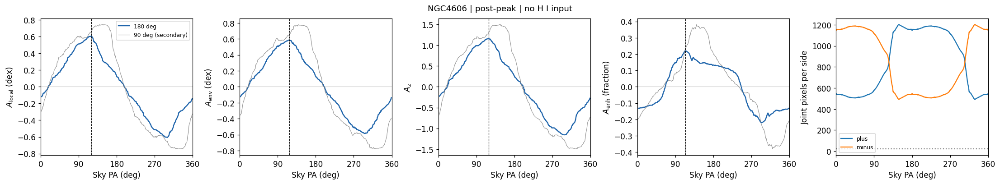

**NGC4606 interpretation:** local maximum 0.607 dex at 120 deg; environmental medians on these same sides are +0.273 / -0.307 dex. The 95%-of-maximum PA set spans 14 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

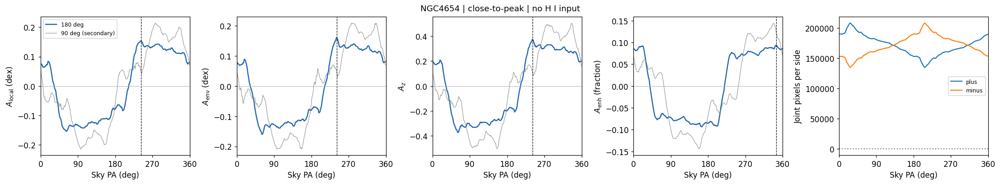

**NGC4654 interpretation:** local maximum 0.154 dex at 243 deg; environmental medians on these same sides are +0.057 / -0.099 dex. The 95%-of-maximum PA set spans 10 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

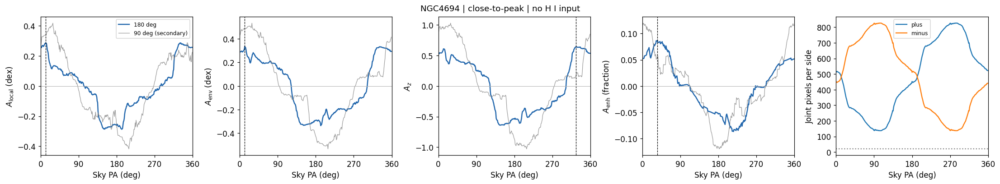

**NGC4694 interpretation:** local maximum 0.287 dex at 12 deg; environmental medians on these same sides are -0.009 / -0.346 dex. The 95%-of-maximum PA set spans 47 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

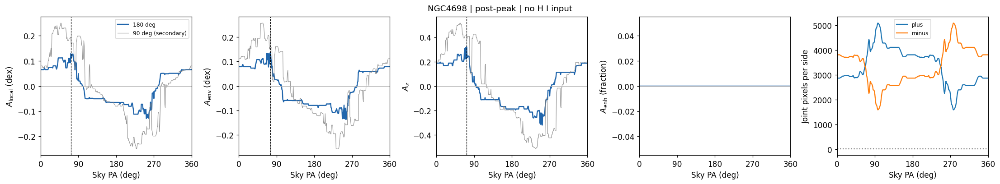

**NGC4698 interpretation:** local maximum 0.129 dex at 72 deg; environmental medians on these same sides are -0.606 / -0.739 dex. The 95%-of-maximum PA set spans 5 deg (not an error bar). Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. Environmental and standardized curves are correlated checks, not independent detections.

In [11]:
for galid,curve in curves.items():
    fig,axes=plt.subplots(1,5,figsize=(20,3.6),layout='constrained')
    for ax,k in zip(axes[:4],METRICS):
        row=direction_summary.loc[direction_summary.GALID.eq(galid)&direction_summary.metric.eq(k)].iloc[0]
        ax.plot(PA_GRID,curve['A'][k],color='#2166ac',lw=1.6,label='180 deg')
        if galid in curves90:
            ax.plot(PA_GRID,curves90[galid]['A'][k],color='0.5',lw=.8,alpha=.8,label='90 deg (secondary)')
        if row.peak_defined:
            ax.axvline(row.theta_deg,color='black',ls='--',lw=.8)
        ax.axhline(0,color='0.7',lw=.7)
        ax.set(xlim=(0,360),xticks=[0,90,180,270,360],xlabel='Sky PA (deg)',ylabel=METRIC_LABELS[k])
    axes[0].legend(fontsize=8)
    axes[4].plot(PA_GRID,curve['counts'][:,0],label='plus')
    axes[4].plot(PA_GRID,curve['counts'][:,1],label='minus')
    axes[4].axhline(MIN_SIDE_PIXELS,color='0.5',ls=':')
    axes[4].set(xlim=(0,360),xticks=[0,90,180,270,360],xlabel='Sky PA (deg)',ylabel='Joint pixels per side')
    axes[4].legend(fontsize=8)
    fig.suptitle(f'{galid} | {spatial[galid]["stage"]} | no H I input',fontsize=12)
    plt.show()
    p=preferred_sides.loc[preferred_sides.GALID.eq(galid)].iloc[0]
    display(Markdown(f'**{galid} interpretation:** local maximum {p.A_local_max:.3f} dex at '
        f'{p.theta_SF:.0f} deg; environmental medians on these same sides are '
        f'{p.env_plus:+.3f} / {p.env_minus:+.3f} dex. '
        f'The 95%-of-maximum PA set spans {p.near_peak_span_deg:.0f} deg (not an error bar). '
        'Inspect broad or multiple peaks and uneven coverage before treating this as a coherent direction. '
        'Environmental and standardized curves are correlated checks, not independent detections.'))

## 9. Optional radial-shuffle null: explicitly not run by default

Scanning angles guarantees a maximum. A random-axis test against the *same map's*
maximum cannot establish gradient significance, so the old wind-first spin test
is not reused here. If enabled, shuffle the three residuals **together** among
positions within 0.5-$R_e$ bins, keeping the same positions, masks, radial-bin
distributions and 360-angle maximization. The Monte Carlo tail probability is
$$p=(1+\#\{A_{\max}^{\rm null}\ge A_{\max}^{\rm obs}\})/(B+1).$$
This null destroys within-bin spatial correlations (including PSF/gas-bin structure).
It tests exchangeable pixels conditional on coarse radius; it does **not** supply
a calibrated significance test against realistic correlated spiral patches.
No spaxel bootstrap or independent-region claim is made. A publication-level test
needs correlation-preserving resampling and footprint/centre sensitivity.
The descriptive result remains useful with this expensive optional test disabled.

In [12]:
shuffle_rows=[]
if RUN_RADIAL_SHUFFLE:
    if N_RADIAL_SHUFFLES < 1000:
        raise ValueError('Use at least 1000 full-scan null realizations')
    for galid,d in direction_inputs.items():
        obs=curves[galid]['A']['local']
        if not np.isfinite(obs).any():
            continue
        seed=RANDOM_SEED+int(hashlib.sha256(galid.encode()).hexdigest()[:8],16)
        rng=np.random.default_rng(seed)
        groups=np.floor(d['radius']/SHUFFLE_RADIAL_WIDTH_RE).astype(int)
        indices=[np.flatnonzero(groups==g) for g in np.unique(groups)]
        maxima=[]
        for b in range(N_RADIAL_SHUFFLES):
            perm=np.arange(len(groups))
            for ix in indices:
                perm[ix]=rng.permutation(ix)
            null=scan_arrays(d['pa'],d['values'][perm])['A']['local']
            maxima.append(np.nanmax(null))
        maxima=np.asarray(maxima)
        shuffle_rows.append(dict(GALID=galid,N_shuffle=len(maxima),
            p_pixel_exchangeability=(1+np.count_nonzero(maxima>=np.nanmax(obs)))/(len(maxima)+1),
            null_p95=np.percentile(maxima,95),observed_max=np.nanmax(obs)))
    display(pd.DataFrame(shuffle_rows))
else:
    print('Radial shuffle NOT RUN. No formal gradient-significance conclusions are available.')

Radial shuffle NOT RUN. No formal gradient-significance conclusions are available.


## 10. Descriptive asymmetry strength by stage

Each point is one eligible **single-centre product/galaxy**, with fixed MAUVE colours.
Stage medians weight galaxies equally; error bars resample whole galaxies 10,000
times and show the 16th--84th percentile of the stage median. These describe sample
uncertainty, not spaxel independence, and do not remove optimization/coverage bias
from $A_{\max}$. There is no formal between-stage gradient-detection claim.

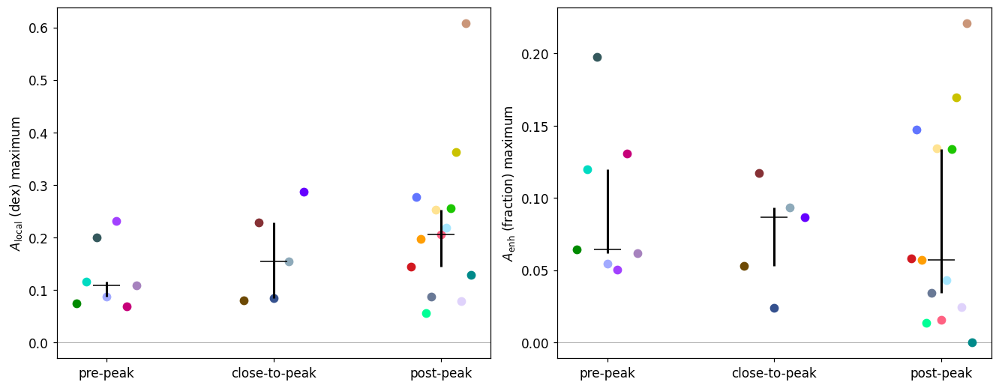

,metric,stage,Ngal,median,boot_p16,boot_p84
0,local,pre-peak,7,0.108984,0.086546,0.116033
1,local,close-to-peak,5,0.153644,0.084900,0.227826
2,local,post-peak,13,0.205307,0.144588,0.252077
3,enh,pre-peak,7,0.064219,0.061498,0.119685
4,enh,close-to-peak,5,0.086684,0.053023,0.093522
5,enh,post-peak,13,0.056995,0.034012,0.133648


**Stage interpretation:** these are optimized amplitudes of the observed, selected SF footprints. Differences can reflect patchiness, radial coverage, inclination or sample composition. The vertical intervals quantify uncertainty on galaxy-equal stage medians only.

In [13]:
galaxy_colors=load_galaxy_colors(GALAXY_COLOR_PATH)
stage_rows=[]
fig,axes=plt.subplots(1,2,figsize=(12,4.6),layout='constrained')
for ax,metric in zip(axes,('local','enh')):
    for j,stage in enumerate(STAGE_ORDER):
        group=direction_summary.loc[direction_summary.metric.eq(metric)&direction_summary.stage.eq(stage)
            &direction_summary.valid_angle_fraction.ge(MIN_VALID_ANGLE_FRACTION)
            &direction_summary.A_max.notna()].sort_values('GALID')
        vals=group.A_max.to_numpy()
        if not len(vals):
            continue
        offsets=np.linspace(-.18,.18,len(vals)) if len(vals)>1 else [0]
        for offset,row in zip(offsets,group.itertuples(index=False)):
            ax.scatter(j+offset,row.A_max,color=galaxy_colors[row.GALID],s=45,zorder=3)
        rng=np.random.default_rng(RANDOM_SEED+j)
        boots=np.median(rng.choice(vals,size=(N_BOOTSTRAP,len(vals)),replace=True),axis=1)
        lo,hi=np.percentile(boots,[16,84]); median=np.median(vals)
        ax.errorbar(j,median,yerr=np.array([[median-lo],[hi-median]]),fmt='k_',ms=24,lw=2,zorder=4)
        stage_rows.append(dict(metric=metric,stage=stage,Ngal=len(vals),median=median,boot_p16=lo,boot_p84=hi))
    ax.set(xticks=range(3),xticklabels=STAGE_ORDER,ylabel=METRIC_LABELS[metric]+' maximum')
    ax.axhline(0,color='0.7',lw=.7)
plt.show()
stage_strength=pd.DataFrame(stage_rows)
display(stage_strength)
display(Markdown('**Stage interpretation:** these are optimized amplitudes of the observed, selected '
    'SF footprints. Differences can reflect patchiness, radial coverage, inclination or sample composition. '
    'The vertical intervals quantify uncertainty on galaxy-equal stage medians only.'))

## 11. Introduce fixed VIVA compass sectors only after the MUSE result

The following pre-existing hypotheses are copied from the first-pass Q4 notebook
and were not adjusted to the new SF peaks. They come from
[Chung et al. (2009), Appendix A](https://arxiv.org/pdf/0909.0781),
[full atlas](https://www.astro.yale.edu/viva/papers/viva_atlas.pdf).
The +/-45 degree bracket is an analyst-selected coarse directional tolerance,
**not a published measurement error or a Gaussian confidence interval**.

| Galaxy | Coarse H I information | Expected compression side | Caveat |
|---|---|---|---|
| NGC4298 | NW diffuse extension, opposite sharp edge | SE (135 deg) | Companion / tidal ambiguity |
| NGC4424 | Southern tail, curving SE | N (0 deg) | Merger/collision, curved tail |
| NGC4501 | SW compressed edge | SW (225 deg) | SW/SE wording conflict in Chung |
| NGC4654 | SE tail, NW compression | NW (315 deg) | Mixed gravitational and ram-pressure effects |
| NGC4694 | H I connection to VCC2062 | Unassigned | Accretion/interaction; no adopted RPS direction |

NGC4501's SW choice is corroborated by the H I description in
[Vollmer et al. (2008)](https://arxiv.org/abs/0801.4874); we retain the current
MAUVE stage rather than substituting that paper's stage terminology.
Metadata explicitly distinguish a tail PA from a compression PA:
$\theta_{\rm RPS}=(\theta_{\rm tail}+180)\bmod360$, while compression PAs are used directly.
Other stages remain available for MUSE asymmetry analysis without invented H I angles.

In [14]:
VIVA_ROWS = [
    dict(GALID='NGC4298',compass='SE',pa_kind='compression',caveat='Companion / tidal ambiguity'),
    dict(GALID='NGC4424',compass='S',pa_kind='tail',caveat='Curved tail; merger/collision'),
    dict(GALID='NGC4501',compass='SW',pa_kind='compression',caveat='Chung SW/SE conflict; Vollmer 2008 SW corroboration'),
    dict(GALID='NGC4654',compass='NW',pa_kind='compression',caveat='Mixed tides and ram pressure'),
]
COMPASS_PA={'N':0.,'NE':45.,'E':90.,'SE':135.,'S':180.,'SW':225.,'W':270.,'NW':315.}
viva=pd.DataFrame(VIVA_ROWS)
assert not viva.GALID.duplicated().any()
assert set(viva.pa_kind) <= {'compression','tail'}
viva['pa_input_deg']=viva.compass.map(COMPASS_PA)
assert viva.pa_input_deg.notna().all()
viva['pa_RPS_deg']=(viva.pa_input_deg+np.where(viva.pa_kind.eq('tail'),180.,0.))%360
viva['half_width_deg']=45.
viva['reference']='Chung et al. 2009 Appendix A; https://arxiv.org/pdf/0909.0781'
viva.loc[viva.GALID.eq('NGC4501'),'reference']+='; https://arxiv.org/abs/0801.4874'
VIVA_SHA256=hashlib.sha256(viva.to_json(orient='records').encode()).hexdigest()
assert hashlib.sha256(direction_summary.to_json(orient='records').encode()).hexdigest()==INFERENCE_SHA256
display(viva)
print('Frozen VIVA metadata checksum:',VIVA_SHA256)

Frozen VIVA metadata checksum: 96fb9d474cfd582b9720c06db6996b86286b7a0fa6d34c1eba56c3a7f7700790


,GALID,compass,pa_kind,caveat,pa_input_deg,pa_RPS_deg,half_width_deg,reference
0,NGC4298,SE,compression,Companion / tidal ambiguity,135.0,135.0,45.0,Chung et al. 2009 Appendix A; https://arxiv.or...
1,NGC4424,S,tail,Curved tail; merger/collision,180.0,0.0,45.0,Chung et al. 2009 Appendix A; https://arxiv.or...
2,NGC4501,SW,compression,Chung SW/SE conflict; Vollmer 2008 SW corrobor...,225.0,225.0,45.0,Chung et al. 2009 Appendix A; https://arxiv.or...
3,NGC4654,NW,compression,Mixed tides and ram pressure,315.0,315.0,45.0,Chung et al. 2009 Appendix A; https://arxiv.or...


## 12. Directed alignment and the environmental state of the SF-preferred side

$$\Delta\theta=|((\theta_{\rm SF}-\theta_{\rm RPS}+180)\bmod360)-180|,$$
with consistency defined by $\Delta\theta\le45$ degrees. Opposite vectors are not
folded together. The main alignment count requires a non-flat unique grid maximum,
at least 90% supported angles and a sourced H I direction; report every exclusion.
This quality rule is independent of the observed alignment outcome.

Classify the **environmental residual on the local-SF-preferred hemisphere**, not
on a separately optimized environmental direction. A positive median is descriptively
above control; two negative medians with a larger preferred-side value mean less
suppression. A near-zero median alone cannot establish statistically normal/maintained SF.
These signs and enhanced fractions cannot prove triggering or causality.

In [15]:
alignment=preferred_sides.merge(viva,on='GALID',how='left',validate='one_to_one')
alignment['delta_theta_deg']=angle_distance(alignment.theta_SF,alignment.pa_RPS_deg)
alignment['testable']=(alignment.pa_RPS_deg.notna()&alignment.peak_defined&alignment.unique_peak
    &alignment.valid_angle_fraction.ge(MIN_VALID_ANGLE_FRACTION))
alignment['aligned']=pd.Series(pd.NA,index=alignment.index,dtype='boolean')
alignment.loc[alignment.testable,'aligned']=(alignment.loc[alignment.testable,'delta_theta_deg']<=45)

def environmental_state(row):
    plus,minus=row.env_plus,row.env_minus
    if not np.isfinite(plus+minus): return 'unavailable'
    if plus>0 and plus>minus: return 'above control on SF-preferred side; positive environmental contrast'
    if plus>0: return 'above control, but not the environmentally stronger side'
    if plus<0 and plus>minus: return 'less suppressed on SF-preferred side; still below control'
    if plus<0: return 'below control; local and environmental preference differ'
    return 'median exactly at control; no inference of equivalence'

alignment['environmental_state']=alignment.apply(environmental_state,axis=1)
alignment['exclusion_reason']=alignment.apply(lambda r:
    'no independent coarse H I direction' if pd.isna(r.pa_RPS_deg) else
    'flat / undefined direction' if not r.peak_defined else
    'exact tied maxima: no unique direction' if not r.unique_peak else
    'insufficient angular coverage' if r.valid_angle_fraction<MIN_VALID_ANGLE_FRACTION else '',axis=1)
alignment['near_peak_sector_overlap']=np.nan
for i,row in alignment.iterrows():
    if pd.notna(row.pa_RPS_deg):
        peak=direction_summary.loc[direction_summary.GALID.eq(row.GALID)&direction_summary.metric.eq('local')].iloc[0]
        near=np.asarray(peak.near_peak_angles)
        if len(near):
            alignment.loc[i,'near_peak_sector_overlap']=np.mean(angle_distance(near,row.pa_RPS_deg)<=45)
display(alignment[['GALID','stage','theta_SF','pa_RPS_deg','delta_theta_deg','testable','aligned',
    'env_plus','env_minus','enh_plus','enh_minus','near_peak_sector_overlap','environmental_state','exclusion_reason']])

alignment_by_metric=direction_summary.merge(viva[['GALID','pa_RPS_deg']],on='GALID',how='left')
alignment_by_metric['delta_theta_deg']=angle_distance(alignment_by_metric.theta_deg,alignment_by_metric.pa_RPS_deg)
display(alignment_by_metric.loc[alignment_by_metric.pa_RPS_deg.notna(),
    ['GALID','metric','theta_deg','A_max','delta_theta_deg','unique_peak']])

,GALID,stage,theta_SF,pa_RPS_deg,delta_theta_deg,testable,aligned,env_plus,env_minus,enh_plus,enh_minus,near_peak_sector_overlap,environmental_state,exclusion_reason
0,IC3392,post-peak,124.0,NaN,NaN,False,<NA>,-0.047415,-0.176885,0.073769,0.037743,NaN,less suppressed on SF-preferred side; still be...,no independent coarse H I direction
1,NGC4064,post-peak,262.0,NaN,NaN,False,<NA>,0.198479,-0.051693,0.255204,0.110668,NaN,above control on SF-preferred side; positive e...,no independent coarse H I direction
2,NGC4189,pre-peak,51.0,NaN,NaN,False,<NA>,0.038211,-0.052772,0.204125,0.146360,NaN,above control on SF-preferred side; positive e...,no independent coarse H I direction
3,NGC4254,pre-peak,102.0,NaN,NaN,False,<NA>,0.301891,0.163090,0.406992,0.287894,NaN,above control on SF-preferred side; positive e...,no independent coarse H I direction
4,NGC4293,post-peak,156.0,NaN,NaN,False,<NA>,-0.459611,-0.559740,0.041509,0.000000,NaN,less suppressed on SF-preferred side; still be...,no independent coarse H I direction
5,NGC4294,pre-peak,260.0,NaN,NaN,False,<NA>,0.236583,0.012706,0.350221,0.152378,NaN,above control on SF-preferred side; positive e...,no independent coarse H I direction
6,NGC4298,close-to-peak,87.0,135.0,48.0,True,False,-0.105449,-0.182714,0.120537,0.074966,0.0,less suppressed on SF-preferred side; still be...,
7,NGC4321,pre-peak,199.0,NaN,NaN,False,<NA>,0.036293,-0.054396,0.213632,0.159279,NaN,above control on SF-preferred side; positive e...,no independent coarse H I direction
8,NGC4351,pre-peak,39.0,NaN,NaN,False,<NA>,-0.101940,-0.278114,0.088553,0.043563,NaN,less suppressed on SF-preferred side; still be...,no independent coarse H I direction
9,NGC4380,post-peak,66.0,NaN,NaN,False,<NA>,-0.500690,-0.571098,0.012400,0.007679,NaN,less suppressed on SF-preferred side; still be...,no independent coarse H I direction


,GALID,metric,theta_deg,A_max,delta_theta_deg,unique_peak
24,NGC4298,local,87.0,0.080533,48.0,True
25,NGC4298,env,87.0,0.077264,48.0,True
26,NGC4298,z,87.0,0.170882,48.0,True
27,NGC4298,enh,80.0,0.053023,55.0,True
56,NGC4424,local,19.0,0.227826,19.0,True
57,NGC4424,env,22.0,0.173294,22.0,True
58,NGC4424,z,22.0,0.369978,22.0,True
59,NGC4424,enh,22.0,0.117254,22.0,True
68,NGC4501,local,203.0,0.084900,22.0,True
69,NGC4501,env,253.0,0.049171,28.0,True


## 13. Close-to-peak polar comparison, including unassigned H I cases

**How to read the dotted circle:** polar radius is a plotting coordinate, not
galactocentric distance. We plot $r_{\rm plot}=r_0+A(\theta)$ to keep every radius
positive. The dotted circle is $r_{\rm plot}=r_0$, i.e. **zero contrast**: the two
hemispheres have equal medians (or equal enhanced fractions). Outside the circle
means plus-side values are higher; inside means lower. It is not an effective
radius, physical ring, significance threshold, or contour in the galaxy.
The labelled radial ticks show the original signed contrast, not the plotting offset.
North is up, **east left and west right**, matching the map panels. Numerical PA
remains east of north; only the display handedness changes.


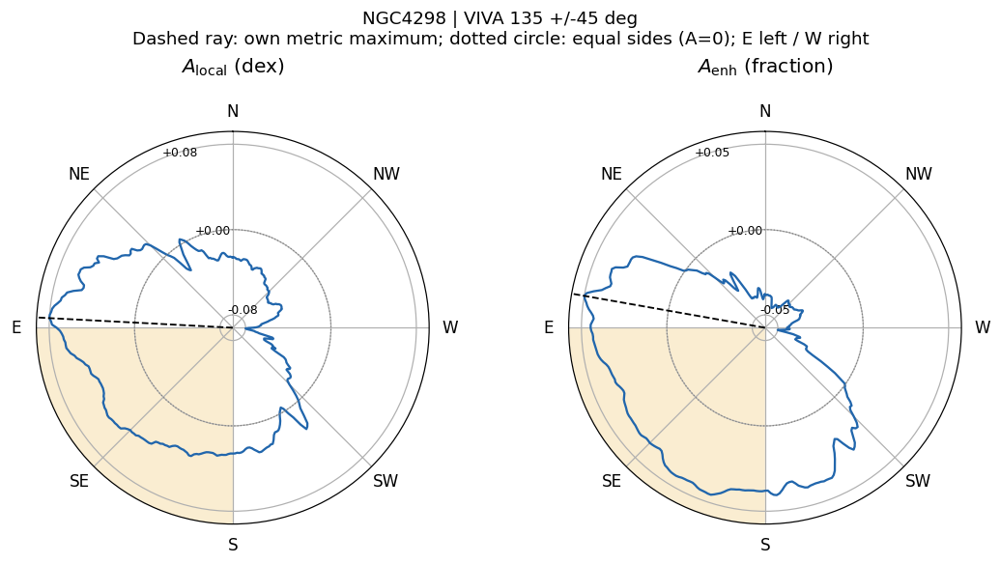

**NGC4298 interpretation:** Local-direction separation 48.0 deg: outside the coarse sector. less suppressed on SF-preferred side; still below control. Radius is offset for display and labelled in signed contrast units, avoiding negative-radius angle reversal. The enhanced-fraction peak is complementary and may point elsewhere. The shaded wedge is a coarse H I tolerance, not an SF-direction confidence interval.

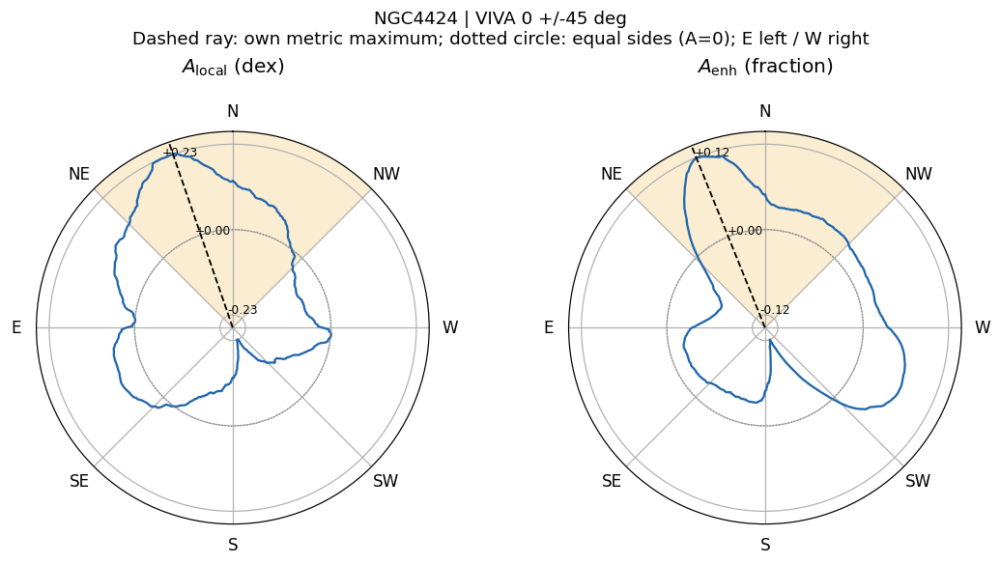

**NGC4424 interpretation:** Local-direction separation 19.0 deg: consistent. above control on SF-preferred side; positive environmental contrast. Radius is offset for display and labelled in signed contrast units, avoiding negative-radius angle reversal. The enhanced-fraction peak is complementary and may point elsewhere. The shaded wedge is a coarse H I tolerance, not an SF-direction confidence interval.

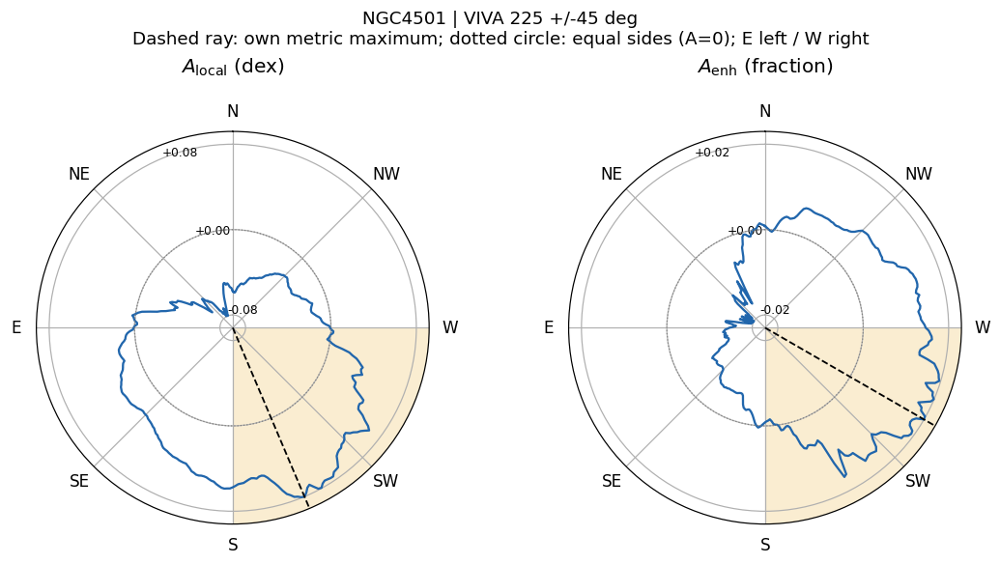

**NGC4501 interpretation:** Local-direction separation 22.0 deg: consistent. less suppressed on SF-preferred side; still below control. Radius is offset for display and labelled in signed contrast units, avoiding negative-radius angle reversal. The enhanced-fraction peak is complementary and may point elsewhere. The shaded wedge is a coarse H I tolerance, not an SF-direction confidence interval.

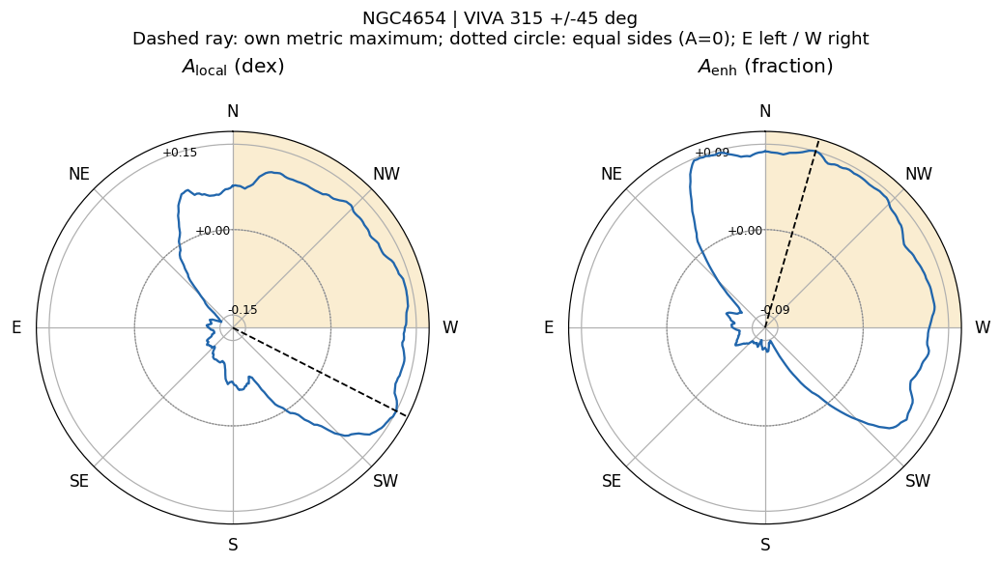

**NGC4654 interpretation:** Local-direction separation 72.0 deg: outside the coarse sector. above control on SF-preferred side; positive environmental contrast. Radius is offset for display and labelled in signed contrast units, avoiding negative-radius angle reversal. The enhanced-fraction peak is complementary and may point elsewhere. The shaded wedge is a coarse H I tolerance, not an SF-direction confidence interval.

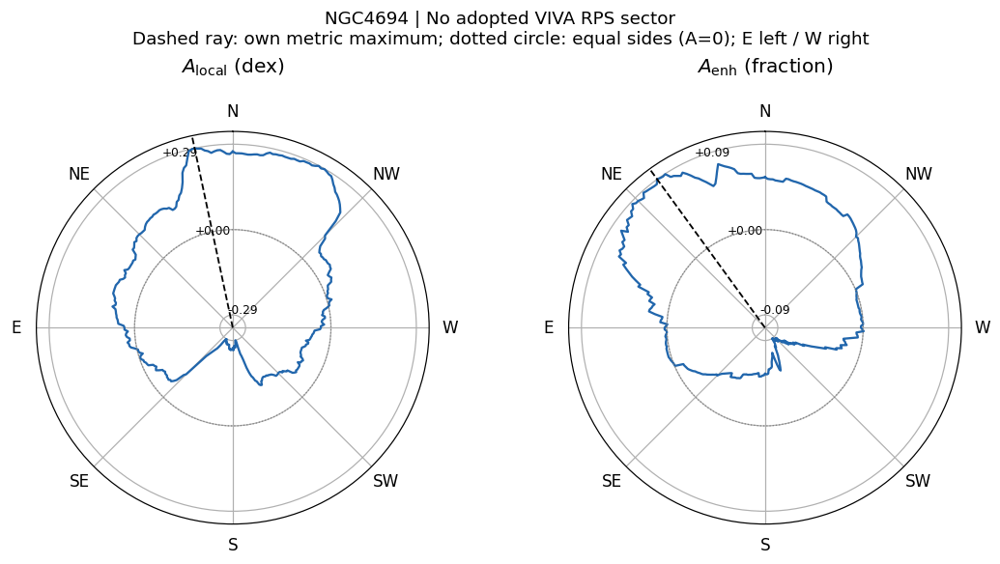

**NGC4694 interpretation:** no independent coarse H I direction. less suppressed on SF-preferred side; still below control. Radius is offset for display and labelled in signed contrast units, avoiding negative-radius angle reversal. The enhanced-fraction peak is complementary and may point elsewhere. The shaded wedge is a coarse H I tolerance, not an SF-direction confidence interval.

In [16]:
def polar_curve(ax,curve,metric,galid,hi):
    a=curve['A'][metric]
    finite=a[np.isfinite(a)]
    if not len(finite):
        ax.set_title('No supported curve'); return
    # Matplotlib negative radii can reverse vectors: use an explicitly labelled offset.
    scale=max(float(np.max(np.abs(finite))),1e-3)
    baseline=1.15*scale
    theta=np.deg2rad(np.r_[PA_GRID,360])
    ax.plot(theta,np.r_[a,a[0]]+baseline,lw=1.5,color='#2166ac')
    ax.plot(theta,np.full(len(theta),baseline),color='0.5',ls=':',lw=.8)
    ticks=np.array([-scale,0,scale])
    ax.set_rticks(ticks+baseline)
    ax.set_yticklabels([f'{v:+.2f}' for v in ticks],fontsize=8)
    ax.set_ylim(0,baseline+1.15*scale)
    ax.set_theta_zero_location('N'); ax.set_theta_direction(1)
    ax.set_thetagrids(np.arange(0,360,45),['N','NE','E','SE','S','SW','W','NW'])
    p=direction_summary.loc[direction_summary.GALID.eq(galid)&direction_summary.metric.eq(metric)].iloc[0]
    if p.peak_defined:
        ax.axvline(np.deg2rad(p.theta_deg),color='black',ls='--',lw=1.2)
    if pd.notna(hi):
        ax.bar(np.deg2rad(hi),baseline+1.15*scale,width=np.pi/2,bottom=0,
               color='#e69f00',alpha=.18,edgecolor='none',zorder=0)
    ax.set_title(METRIC_LABELS[metric],pad=20)

for galid in close_ids:
    if galid not in curves: continue
    row=alignment.loc[alignment.GALID.eq(galid)].iloc[0]
    fig,axes=plt.subplots(1,2,figsize=(10,5.2),subplot_kw={'projection':'polar'},layout='constrained')
    for ax,metric in zip(axes,('local','enh')):
        polar_curve(ax,curves[galid],metric,galid,row.pa_RPS_deg)
    label=f'VIVA {row.pa_RPS_deg:.0f} +/-45 deg' if pd.notna(row.pa_RPS_deg) else 'No adopted VIVA RPS sector'
    fig.suptitle(f'{galid} | {label}\nDashed ray: own metric maximum; dotted circle: equal sides (A=0); E left / W right',fontsize=12)
    plt.show()
    status=(f'Local-direction separation {row.delta_theta_deg:.1f} deg: '
            + ('consistent' if bool(row.aligned) else 'outside the coarse sector')) if row.testable else row.exclusion_reason
    display(Markdown(f'**{galid} interpretation:** {status}. {row.environmental_state}. '
        'Radius is offset for display and labelled in signed contrast units, avoiding negative-radius angle reversal. '
        'The enhanced-fraction peak is complementary and may point elsewhere. '
        'The shaded wedge is a coarse H I tolerance, not an SF-direction confidence interval.'))


## Close-to-peak five-panel maps after direction inference

Repeat the five map panels with **north up, east left, west right**. Cyan arrows
show the inferred SF direction. The thin amber arrow and translucent amber
sector show the independent VIVA compression PA and its fixed +/-45-degree
tolerance. The same primary SF angle is drawn on every panel; it is not refitted
to each panel. A cyan arrow's length is only a display guide, not an amplitude.
The VIVA wedge is a sky-angle overlay, not a fitted contour or a mask used in inference.
Original MUSE-only maps remain above, so H I is introduced only after inference.
NGC4694 has no adopted H I sector and receives no invented amber arrow/wedge.


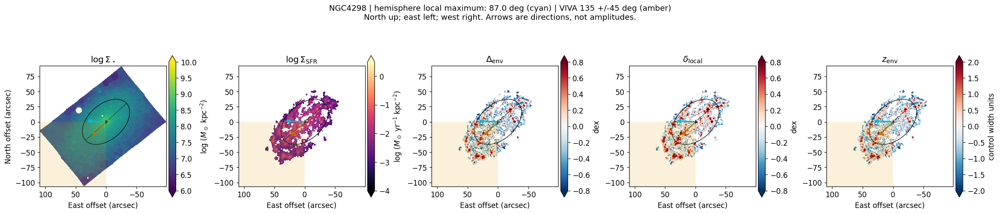

**NGC4298:** the same independently inferred SF PA is overlaid on all five panels. Preferred/opposite environmental medians: -0.105/-0.183 dex. less suppressed on SF-preferred side; still below control. The amber sector is only the fixed external comparison; no pixels were selected or weighted by H I orientation.

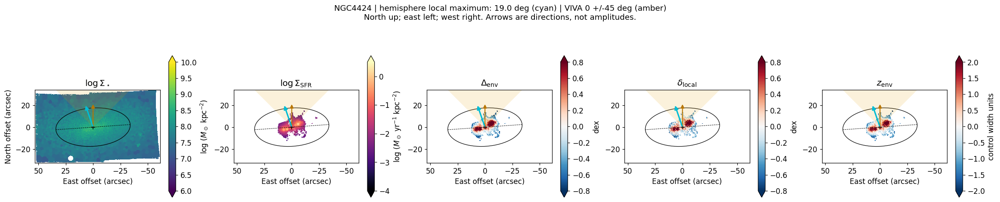

**NGC4424:** the same independently inferred SF PA is overlaid on all five panels. Preferred/opposite environmental medians: +0.052/-0.114 dex. above control on SF-preferred side; positive environmental contrast. The amber sector is only the fixed external comparison; no pixels were selected or weighted by H I orientation.

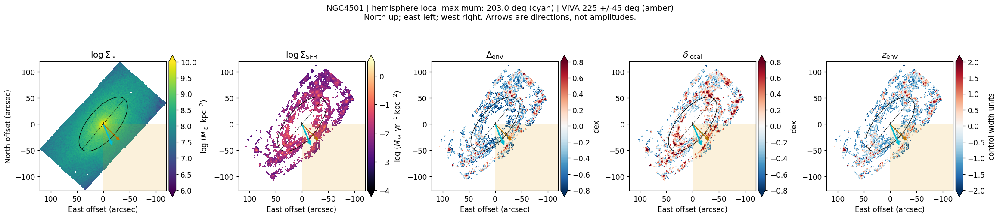

**NGC4501:** the same independently inferred SF PA is overlaid on all five panels. Preferred/opposite environmental medians: -0.223/-0.260 dex. less suppressed on SF-preferred side; still below control. The amber sector is only the fixed external comparison; no pixels were selected or weighted by H I orientation.

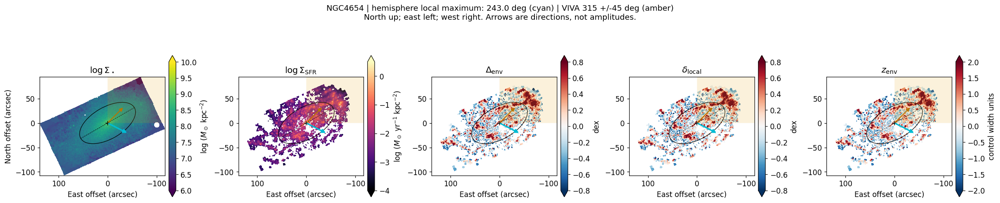

**NGC4654:** the same independently inferred SF PA is overlaid on all five panels. Preferred/opposite environmental medians: +0.057/-0.099 dex. above control on SF-preferred side; positive environmental contrast. The amber sector is only the fixed external comparison; no pixels were selected or weighted by H I orientation.

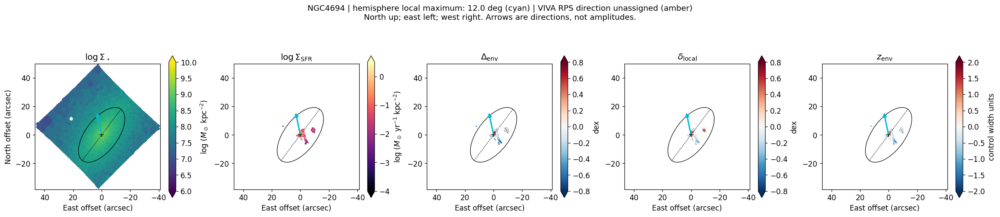

**NGC4694:** the same independently inferred SF PA is overlaid on all five panels. Preferred/opposite environmental medians: -0.009/-0.346 dex. less suppressed on SF-preferred side; still below control. The amber sector is only the fixed external comparison; no pixels were selected or weighted by H I orientation.

In [17]:
SF_ESTIMATOR_LABEL = 'hemisphere local maximum'

from matplotlib.patches import Polygon
from matplotlib.lines import Line2D

def pa_vector(pa_deg,length):
    theta=np.deg2rad(pa_deg)
    return np.array([length*np.sin(theta),length*np.cos(theta)])

def add_sky_directions(ax,m,theta_sf,theta_hi):
    # Positive E remains the data coordinate; inverted x axis puts E on the left.
    xlim,ylim=ax.get_xlim(),ax.get_ylim()
    radius=1.1*np.hypot(max(abs(np.asarray(xlim))),max(abs(np.asarray(ylim))))
    comp=m['components'].iloc[0]
    length=min(.75*comp.a_re_arcsec,.65*min(max(abs(np.asarray(xlim))),max(abs(np.asarray(ylim)))))
    if np.isfinite(theta_hi):
        angles=np.linspace(theta_hi-45,theta_hi+45,181)
        arc=np.column_stack([radius*np.sin(np.deg2rad(angles)),radius*np.cos(np.deg2rad(angles))])
        ax.add_patch(Polygon(np.vstack([[0,0],arc,[0,0]]),closed=True,facecolor='#e69f00',
            edgecolor='none',alpha=.14,zorder=2))
        v=pa_vector(theta_hi,length)
        ax.annotate('',xy=v,xytext=(0,0),arrowprops=dict(arrowstyle='-|>',lw=1.4,color='#b87500'),zorder=5)
    if np.isfinite(theta_sf):
        v=pa_vector(theta_sf,length)
        ax.annotate('',xy=v,xytext=(0,0),arrowprops=dict(arrowstyle='-|>',lw=2.1,color='#00bcd4'),zorder=6)
    ax.set_xlim(xlim);ax.set_ylim(ylim)
    assert ax.xaxis_inverted()

for galid in close_ids:
    if galid not in curves: continue
    m=spatial[galid]
    row=alignment.loc[alignment.GALID.eq(galid)].iloc[0]
    panels=[np.where(m['valid_disc_mask'],m['log_sigma_star'],np.nan),
            np.where(m['sf_mask'],m['log_sigma_sfr'],np.nan),m['delta_env'],m['delta_local'],m['z_env']]
    labels=[r'$\log\Sigma_\star$',r'$\log\Sigma_{\rm SFR}$',r'$\Delta_{\rm env}$',r'$\delta_{\rm local}$',r'$z_{\rm env}$']
    ranges=[(6,10),(-4,.5),(-RESIDUAL_VLIM,RESIDUAL_VLIM),(-RESIDUAL_VLIM,RESIDUAL_VLIM),(-Z_VLIM,Z_VLIM)]
    units=[r'log ($M_\odot$ kpc$^{-2}$)',r'log ($M_\odot$ yr$^{-1}$ kpc$^{-2}$)','dex','dex','control width units']
    fig,axes=plt.subplots(1,5,figsize=(21,4.8),layout='constrained')
    for ax,data,label,limits,cmap,unit in zip(axes,panels,labels,ranges,
            ['viridis','magma','RdBu_r','RdBu_r','RdBu_r'],units):
        im=ax.pcolormesh(m['east'],m['north'],np.ma.masked_invalid(data),shading='nearest',
            cmap=cmap,vmin=limits[0],vmax=limits[1],rasterized=True)
        decorate_blind_map(ax,m)
        add_sky_directions(ax,m,row.theta_SF,row.pa_RPS_deg)
        ax.set_title(label)
        fig.colorbar(im,ax=ax,shrink=.7,pad=.02,extend='both',label=unit)
    axes[0].set_ylabel('North offset (arcsec)')
    hi_label=f'VIVA {row.pa_RPS_deg:.0f} +/-45 deg' if np.isfinite(row.pa_RPS_deg) else 'VIVA RPS direction unassigned'
    fig.suptitle(f'{galid} | {SF_ESTIMATOR_LABEL}: {row.theta_SF:.1f} deg (cyan) | {hi_label} (amber)\n'
                 'North up; east left; west right. Arrows are directions, not amplitudes.',fontsize=12)
    plt.show()
    display(Markdown(f'**{galid}:** the same independently inferred SF PA is overlaid on all five panels. '
        f'Preferred/opposite environmental medians: {row.env_plus:+.3f}/{row.env_minus:+.3f} dex. '
        f'{row.environmental_state}. The amber sector is only the fixed external comparison; '
        'no pixels were selected or weighted by H I orientation.'))


## 14. Alignment count and secondary sector sensitivity

For a uniform **directed** angle, a +/-45 degree window covers $90/360=0.25$.
Report the one-sided binomial tail $P(K\ge k\mid N,p_0=0.25)$ for the primary
local direction in the close-to-peak subset. This is a transparent **idealized benchmark**,
not a calibrated detection probability: shared major-axis geometry, footprint bias,
retrospective choices, correlated objects and uncertain H I interpretation may violate
uniformity/independence. Do not choose whichever residual metric or sector width aligns best.

In [18]:
testable=alignment.loc[alignment.stage.eq('close-to-peak')&alignment.testable]
N=len(testable); k=int(testable.aligned.sum())
p_binomial=binomtest(k,N,p=.25,alternative='greater').pvalue if N else np.nan
print(f'Primary local-direction coarse alignment: {k}/{N}; idealized P(K>=k | p=0.25)={p_binomial:.5g}')
print('All close-to-peak candidates:',close_ids)
print('Excluded close-to-peak cases:')
display(alignment.loc[alignment.stage.eq('close-to-peak')&~alignment.testable,['GALID','exclusion_reason']])
sector_rows=[]
for galid,curve90 in curves90.items():
    p90=peak_summary(curve90,'local')
    p180=preferred_sides.loc[preferred_sides.GALID.eq(galid)].iloc[0]
    sector_rows.append(dict(GALID=galid,theta_180=p180.theta_SF,theta_90=p90['theta_deg'],
        A_180=p180.A_local_max,A_90=p90['A_max'],
        shift_deg=float(angle_distance(p90['theta_deg'],p180.theta_SF)),
        coverage_90=p90['valid_angle_fraction']))
sector_sensitivity=pd.DataFrame(sector_rows)
display(sector_sensitivity)

Primary local-direction coarse alignment: 2/4; idealized P(K>=k | p=0.25)=0.26172
All close-to-peak candidates: ['NGC4298', 'NGC4424', 'NGC4501', 'NGC4654', 'NGC4694']
Excluded close-to-peak cases:


,GALID,exclusion_reason
23,NGC4694,no independent coarse H I direction


,GALID,theta_180,theta_90,A_180,A_90,shift_deg,coverage_90
0,IC3392,124.0,108.0,0.144588,0.248649,16.0,1.000000
1,NGC4064,262.0,223.0,0.276359,0.412816,39.0,1.000000
2,NGC4189,51.0,106.0,0.074130,0.114750,55.0,1.000000
3,NGC4254,102.0,77.0,0.116033,0.121881,25.0,1.000000
4,NGC4293,156.0,33.0,0.196543,0.196543,123.0,0.461111
5,NGC4294,260.0,305.0,0.199812,0.206986,45.0,1.000000
6,NGC4298,87.0,172.0,0.080533,0.076918,85.0,1.000000
7,NGC4321,199.0,217.0,0.086546,0.116218,18.0,1.000000
8,NGC4351,39.0,356.0,0.231109,0.286062,43.0,1.000000
9,NGC4380,66.0,131.0,0.056091,0.068644,65.0,1.000000


## 15. Reproducibility checks and dynamically generated scientific synthesis

In [19]:
assert set(spatial)==set(q4_sample.GALID)
assert set(q4_sample.GALID)==set(q3_metrics.loc[q3_metrics.eligible_primary,'GALID'])
assert set(curves)|set(direction_exclusions.GALID)==set(spatial)
assert not (set(curves)&set(direction_exclusions.GALID))
for galid,m in spatial.items():
    assert np.all(~m['joint_mask']|m['environment_mask'])
    assert np.all(~m['environment_mask']|m['sf_mask'])
for galid,curve in curves.items():
    for metric in METRICS:
        np.testing.assert_allclose(curve['A'][metric][:180],-curve['A'][metric][180:],equal_nan=True)
    assert np.all(np.abs(curve['A']['enh'][np.isfinite(curve['A']['enh'])])<=1)
    assert np.all(np.isfinite(direction_inputs[galid]['values']))
assert hashlib.sha256(direction_summary.to_json(orient='records').encode()).hexdigest()==INFERENCE_SHA256
assert hashlib.sha256(viva.to_json(orient='records').encode()).hexdigest()==VIVA_SHA256
np.testing.assert_allclose(angle_distance([359,0,0],[1,180,360]),[2,180,0])
print('PASS: Q3 sample identity, exact residual-map mapping (section 5), mask nesting,')
print('full directional partition, 180-degree antisymmetry, fraction bounds, and frozen inference/H I metadata.')
for name,frame in [('Q4_direction_summary.csv',direction_summary),('Q4_preferred_sides.csv',preferred_sides),
                   ('Q4_alignment.csv',alignment),('Q4_stage_strength.csv',stage_strength),
                   ('Q4_sector_sensitivity.csv',sector_sensitivity)]:
    save_table(frame,name)

parts=[f'### Saved-run scientific synthesis',
    f'The reconstructed Q3 sample contains **{len(q4_sample)} products**, with stage counts '
    f'{q4_sample.groupby("stage").size().reindex(STAGE_ORDER).to_dict()}. '
    f'Five-panel maps are retained for all products; **{len(curves)} single-centre galaxies** have angle scans. '
    'The combined NGC4567/8 product is not assigned a single SF direction.',
    f'Among close-to-peak galaxies, **{k}/{N}** testable local-SF directions fall in the fixed VIVA '
    f'+/-45 degree sectors. The idealized uniform-direction binomial tail is **{p_binomial:.4g}**. '
    'This benchmark is not a formal detection or a causal RPS test.']
for r in alignment.loc[alignment.stage.eq('close-to-peak')].itertuples(index=False):
    parts.append(f'**{r.GALID}:** local PA {r.theta_SF:.0f} deg, contrast {r.A_local_max:.3f} dex; '
        f'preferred/opposite environmental medians {r.env_plus:+.3f}/{r.env_minus:+.3f} dex; '
        f'enhanced fractions {r.enh_plus:.3f}/{r.enh_minus:.3f}. '
        f'{r.environmental_state}. '+(f'H I separation {r.delta_theta_deg:.1f} deg.' if r.testable else r.exclusion_reason+'.'))
parts.append('**Scope of inference:** optimized asymmetry is descriptive. '+
    ('The optional pixel-exchangeability null was run, with its stated correlation limitations.' if RUN_RADIAL_SHUFFLE
     else 'The radial-shuffle null was not run; no significant-gradient claim is made.')+
    ' Agreement of environmental and standardized maps is not independent replication. '
    'Within-galaxy enhancement does not by itself establish above-control SF. '
    'Before paper-level interpretation, check PSF/bin correlations, footprint and centre sensitivity, '
    'radial imbalance, tied/broad peaks and mixed tidal/ram-pressure provenance. '
    'H I alignment means geometric consistency only; no wind vector or causal triggering is inferred.')
display(Markdown('\n\n'.join(parts)))

PASS: Q3 sample identity, exact residual-map mapping (section 5), mask nesting,
full directional partition, 180-degree antisymmetry, fraction bounds, and frozen inference/H I metadata.


### Saved-run scientific synthesis

The reconstructed Q3 sample contains **26 products**, with stage counts {'pre-peak': 8, 'close-to-peak': 5, 'post-peak': 13}. Five-panel maps are retained for all products; **25 single-centre galaxies** have angle scans. The combined NGC4567/8 product is not assigned a single SF direction.

Among close-to-peak galaxies, **2/4** testable local-SF directions fall in the fixed VIVA +/-45 degree sectors. The idealized uniform-direction binomial tail is **0.2617**. This benchmark is not a formal detection or a causal RPS test.

**NGC4298:** local PA 87 deg, contrast 0.081 dex; preferred/opposite environmental medians -0.105/-0.183 dex; enhanced fractions 0.121/0.075. less suppressed on SF-preferred side; still below control. H I separation 48.0 deg.

**NGC4424:** local PA 19 deg, contrast 0.228 dex; preferred/opposite environmental medians +0.052/-0.114 dex; enhanced fractions 0.237/0.124. above control on SF-preferred side; positive environmental contrast. H I separation 19.0 deg.

**NGC4501:** local PA 203 deg, contrast 0.085 dex; preferred/opposite environmental medians -0.223/-0.260 dex; enhanced fractions 0.058/0.049. less suppressed on SF-preferred side; still below control. H I separation 22.0 deg.

**NGC4654:** local PA 243 deg, contrast 0.154 dex; preferred/opposite environmental medians +0.057/-0.099 dex; enhanced fractions 0.225/0.152. above control on SF-preferred side; positive environmental contrast. H I separation 72.0 deg.

**NGC4694:** local PA 12 deg, contrast 0.287 dex; preferred/opposite environmental medians -0.009/-0.346 dex; enhanced fractions 0.075/0.008. less suppressed on SF-preferred side; still below control. no independent coarse H I direction.

**Scope of inference:** optimized asymmetry is descriptive. The radial-shuffle null was not run; no significant-gradient claim is made. Agreement of environmental and standardized maps is not independent replication. Within-galaxy enhancement does not by itself establish above-control SF. Before paper-level interpretation, check PSF/bin correlations, footprint and centre sensitivity, radial imbalance, tied/broad peaks and mixed tidal/ram-pressure provenance. H I alignment means geometric consistency only; no wind vector or causal triggering is inferred.

### Verification of this updated saved run

- All 19 code cells executed sequentially with ICRAR Python against live inputs;
  63 figures embedded, no stored execution errors or stderr.
- Q3's reference, scatter and galaxy-metric tables exactly reproduce its saved outputs.
- Every polar axis was checked north-up/east-left/west-right, and every sky-map x axis
  was checked inverted. Numerical astronomical PA values were not reflected or changed.
- The new close-to-peak gallery draws the same primary SF direction on all five panels,
  with independently specified VIVA PA +/-45-degree sky sectors where available.
- Formal gradient uncertainties and correlation-aware significance tests were not computed.
  FITS inputs and Q3 notebook were only read.
- The original hemisphere direction and VIVA alignment result tables are unchanged.
- Visually inspected all five updated close-to-peak polar plots and all five
  new five-panel map overlays for orientation, arrows, sectors and readability.


### Final reading guide

Read the maps, directional diagnostics and numerical synthesis together. Positive
local variation means stronger relative to the galaxy's own trend; the environmental
side medians determine whether SF is above the pre-peak control or merely less suppressed.
All polar and sky-map displays place east left and west right. Dotted circles are
zero-value references in shifted polar plots, not physical rings in the galaxies.
